# Capstone Project - Optimising Student Retention and Educational Outcomes 01

EDA / Data Preprocessing

## Open University Learning Analytics dataset

### Source:
https://analyse.kmi.open.ac.uk/open_dataset#description



In [1]:
# Load the libraries and modules
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from ydata_profiling import ProfileReport

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

# Load and Inspect Data

In [2]:
assessments = pd.read_csv('data_ou/assessments.csv')
courses = pd.read_csv('data_ou/courses.csv')
stud_assm = pd.read_csv('data_ou/studentAssessment.csv')
stud_info = pd.read_csv('data_ou/studentInfo.csv')
stud_reg = pd.read_csv('data_ou/studentRegistration.csv')
stud_vle = pd.read_csv('data_ou/studentVle.csv')
vle = pd.read_csv('data_ou/vle.csv')

In [3]:
assessments.head()

,code_module,code_presentation,id_assessment,assessment_type,date,weight
0,AAA,2013J,1752,TMA,19.0,10.0
1,AAA,2013J,1753,TMA,54.0,20.0
2,AAA,2013J,1754,TMA,117.0,20.0
3,AAA,2013J,1755,TMA,166.0,20.0
4,AAA,2013J,1756,TMA,215.0,30.0


In [4]:
courses.head()

,code_module,code_presentation,module_presentation_length
0,AAA,2013J,268
1,AAA,2014J,269
2,BBB,2013J,268
3,BBB,2014J,262
4,BBB,2013B,240


In [5]:
stud_assm.head()

,id_assessment,id_student,date_submitted,is_banked,score
0,1752,11391,18,0,78.0
1,1752,28400,22,0,70.0
2,1752,31604,17,0,72.0
3,1752,32885,26,0,69.0
4,1752,38053,19,0,79.0


In [6]:
stud_info.head()

,code_module,code_presentation,id_student,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,disability,final_result
0,AAA,2013J,11391,M,East Anglian Region,HE Qualification,90-100%,55<=,0,240,N,Pass
1,AAA,2013J,28400,F,Scotland,HE Qualification,20-30%,35-55,0,60,N,Pass
2,AAA,2013J,30268,F,North Western Region,A Level or Equivalent,30-40%,35-55,0,60,Y,Withdrawn
3,AAA,2013J,31604,F,South East Region,A Level or Equivalent,50-60%,35-55,0,60,N,Pass
4,AAA,2013J,32885,F,West Midlands Region,Lower Than A Level,50-60%,0-35,0,60,N,Pass


In [7]:
stud_reg.head()

,code_module,code_presentation,id_student,date_registration,date_unregistration
0,AAA,2013J,11391,-159.0,NaN
1,AAA,2013J,28400,-53.0,NaN
2,AAA,2013J,30268,-92.0,12.0
3,AAA,2013J,31604,-52.0,NaN
4,AAA,2013J,32885,-176.0,NaN


In [8]:
stud_vle.head(10)

,code_module,code_presentation,id_student,id_site,date,sum_click
0,AAA,2013J,28400,546652,-10,4
1,AAA,2013J,28400,546652,-10,1
2,AAA,2013J,28400,546652,-10,1
3,AAA,2013J,28400,546614,-10,11
4,AAA,2013J,28400,546714,-10,1
5,AAA,2013J,28400,546652,-10,8
6,AAA,2013J,28400,546876,-10,2
7,AAA,2013J,28400,546688,-10,15
8,AAA,2013J,28400,546662,-10,17
9,AAA,2013J,28400,546890,-10,1


In [9]:
vle.head()

,id_site,code_module,code_presentation,activity_type,week_from,week_to
0,546943,AAA,2013J,resource,NaN,NaN
1,546712,AAA,2013J,oucontent,NaN,NaN
2,546998,AAA,2013J,resource,NaN,NaN
3,546888,AAA,2013J,url,NaN,NaN
4,547035,AAA,2013J,resource,NaN,NaN


# EDA

In [10]:
profile_stud_info = ProfileReport(stud_info, title='Student Info Profiling Report', explorative=True)
profile_stud_info

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
profile_stud_reg = ProfileReport(stud_reg, title='Student Info Profiling Report', explorative=True)
profile_stud_reg

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:
profile_stud_vle = ProfileReport(stud_vle, title='Student Info Profiling Report', explorative=True)
profile_stud_vle

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [13]:
# Check for missing values
stud_info.isna().sum()

code_module                0
code_presentation          0
id_student                 0
gender                     0
region                     0
highest_education          0
imd_band                1111
age_band                   0
num_of_prev_attempts       0
studied_credits            0
disability                 0
final_result               0
dtype: int64

In [14]:
# Check if the imd_band column is related to the region column:
# pd.set_option('display.max_rows', None)
# stud_info.groupby('region')['imd_band'].fillna('unknown').value_counts()

In [15]:
# Replace missing values in 'imd_band' with 'unknown' and explode the dataframe
imd_bands_exploded = stud_info[['region', 'imd_band']].fillna('unknown').explode('imd_band')
imd_bands_exploded.groupby('region')['imd_band'].value_counts()

region               imd_band
East Anglian Region  90-100%     413
                     70-80%      411
                     40-50%      411
                     80-90%      401
                     60-70%      400
                                ... 
Yorkshire Region     70-80%      177
                     60-70%      156
                     80-90%      114
                     90-100%      61
                     unknown       5
Name: count, Length: 138, dtype: int64

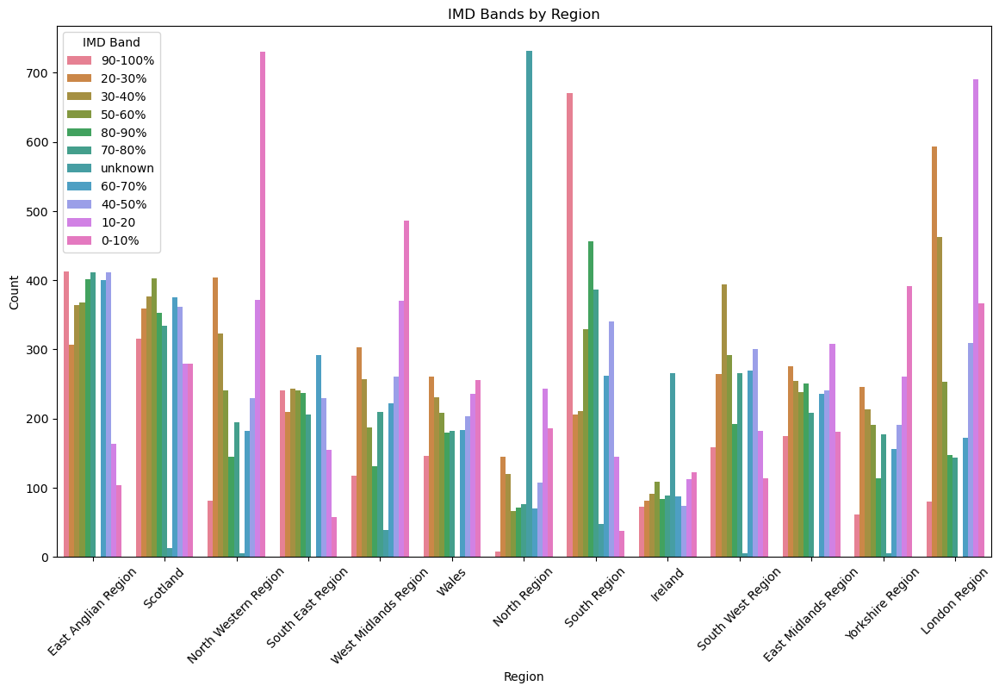

In [16]:
# Plot the data
plt.figure(figsize=(14, 8))
sns.countplot(data=imd_bands_exploded, x='region', hue='imd_band')
plt.xticks(rotation=45)
plt.title('IMD Bands by Region')
plt.xlabel('Region')
plt.ylabel('Count')
plt.legend(title='IMD Band', loc='upper left')
plt.show()

### Handling missing values:

Given that the missing values are not randomly distributed and do not appear to correlate with region (ie. heavily concentrated in North Region and Ireland, and that the 'unknown' group has the highest count in these regions), it makes more sense to treat it as a separate category.

In [17]:
# Fill missing values as 'unknown'
stud_info['imd_band_new'] = stud_info['imd_band'].fillna('unknown')
stud_info['imd_band_new'].value_counts()

imd_band_new
20-30%     3654
30-40%     3539
10-20      3516
0-10%      3311
40-50%     3256
50-60%     3124
60-70%     2905
70-80%     2879
80-90%     2762
90-100%    2536
unknown    1111
Name: count, dtype: int64

In [18]:
# Simplify the 'imd_band_new' column
stud_info['imd_band_group'] = stud_info['imd_band_new'].apply(
    lambda x: 'unknown' if x == 'unknown' else ('up to 50%' if int(x.split('-')[0]) < 50 else 'over 50%')
)
stud_info['imd_band_group'].value_counts()

imd_band_group
up to 50%    17276
over 50%     14206
unknown       1111
Name: count, dtype: int64

In [19]:
stud_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32593 entries, 0 to 32592
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   code_module           32593 non-null  object
 1   code_presentation     32593 non-null  object
 2   id_student            32593 non-null  int64 
 3   gender                32593 non-null  object
 4   region                32593 non-null  object
 5   highest_education     32593 non-null  object
 6   imd_band              31482 non-null  object
 7   age_band              32593 non-null  object
 8   num_of_prev_attempts  32593 non-null  int64 
 9   studied_credits       32593 non-null  int64 
 10  disability            32593 non-null  object
 11  final_result          32593 non-null  object
 12  imd_band_new          32593 non-null  object
 13  imd_band_group        32593 non-null  object
dtypes: int64(3), object(11)
memory usage: 3.5+ MB


### Inspect the target:

In [20]:
stud_info['final_result'].value_counts()

final_result
Pass           12361
Withdrawn      10156
Fail            7052
Distinction     3024
Name: count, dtype: int64

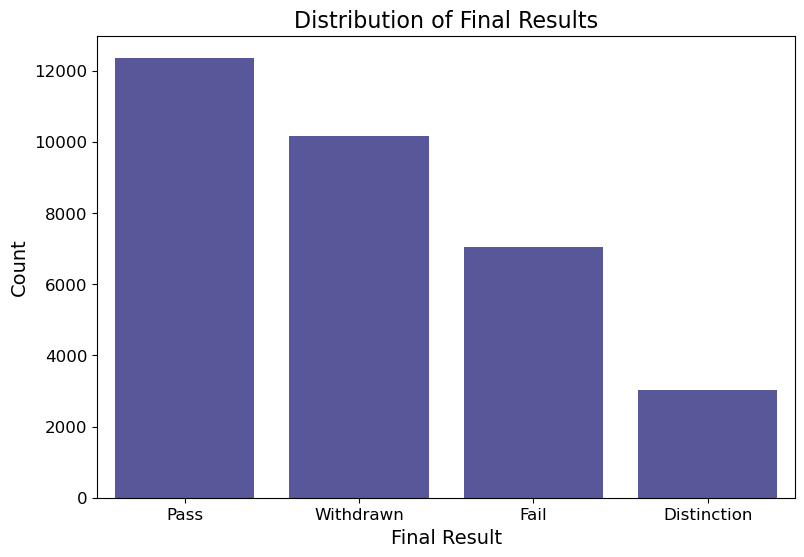

In [21]:
# Visualise target in bar chart:
plt.figure(figsize=(9, 6))
sns.countplot(data=stud_info, x='final_result', color='navy', alpha=0.7)
plt.title('Distribution of Final Results', fontsize=16)
plt.xlabel('Final Result', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

### Plan 1 - Group the final_results to 3 categories: 

Success / Fail / Withdrawn, with Pass & Distinction both under Success, as the focus of this project is to help identify students who are more likely to Fail or Withdraw early in the learning process, investigate the key factors that may contribute to the learning outcomes, and provide interventions (e.g. curriculum design improvement or personalised student engagement strategies) for targeted groups.

In [22]:
stud_info['outcome_3'] = stud_info['final_result'].map({'Pass': 'Success', 'Distinction': 'Success', 'Fail': 'Fail', 'Withdrawn': 'Withdrawn'})
stud_info['outcome_3'].value_counts()

outcome_3
Success      15385
Withdrawn    10156
Fail          7052
Name: count, dtype: int64

### Plan 2 - Group the final_results to 2 categories (binary): 

Success (Pass & Distinction) / At-Risk (Fail & Withdrawn) -
* Simplicity: Treating it as a binary classification problem simplifies the task, making the model easier to train, tune, and interpret
* Clear Intervention: Both Fail and Withdrawn students need intervention, so grouping them provides a single actionable outcome

In [ ]:
stud_info['at_risk'] = stud_info['outcome_3'].apply(lambda x: 0 if x == 'Success' else 1)
stud_info['at_risk'].value_counts()

at_risk
1    17208
0    15385
Name: count, dtype: int64

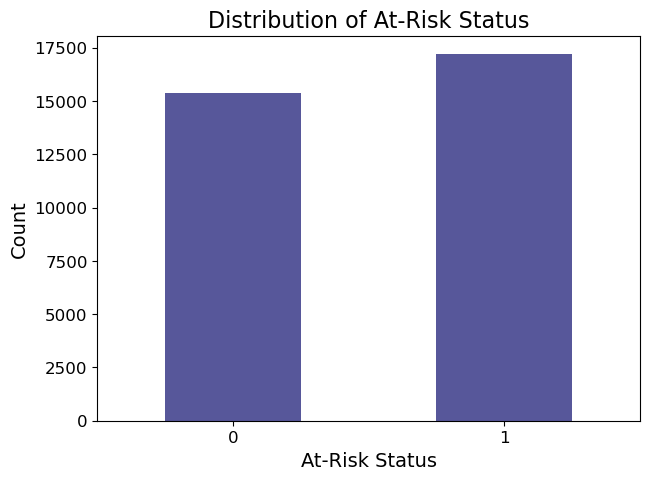

In [24]:
plt.figure(figsize=(7, 5))
sns.countplot(data=stud_info, x='at_risk', color='navy', alpha=0.7, width=0.5)
plt.title('Distribution of At-Risk Status', fontsize=16)
plt.xlabel('At-Risk Status', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

### Check the registration details (for students who have withdrawn)

In [25]:
# Check stats summary of unregristered days 
stud_reg['date_unregistration'].describe()

count    10072.000000
mean        49.757645
std         82.460890
min       -365.000000
25%         -2.000000
50%         27.000000
75%        109.000000
max        444.000000
Name: date_unregistration, dtype: float64

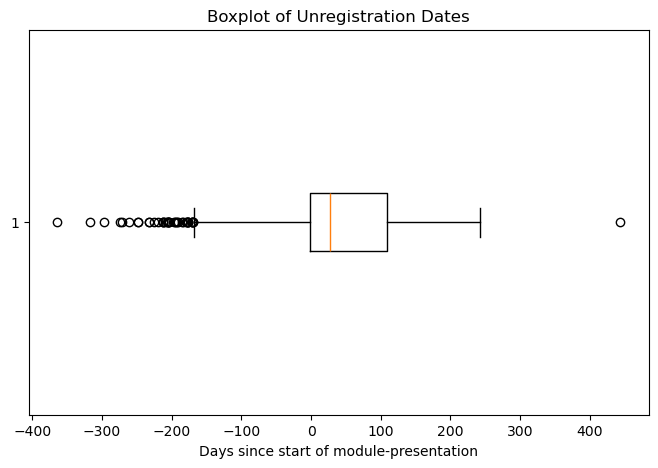

In [26]:
# Plot distribution for non-null unregistration dates
if stud_reg['date_unregistration'].notnull().any():
    plt.figure(figsize=(8, 5))
    plt.boxplot(stud_reg['date_unregistration'].dropna(), vert=False)
    plt.title('Boxplot of Unregistration Dates')
    plt.xlabel('Days since start of module-presentation')
    plt.show()
else:
    print("No unregistration dates available to plot.")

In [27]:
# Check for unregistration outliers
stud_reg[stud_reg['date_unregistration'] > 300]

,code_module,code_presentation,id_student,date_registration,date_unregistration
25249,FFF,2013J,586851,-22.0,444.0


In [28]:
stud_info[stud_info['id_student'] == 586851]

,code_module,code_presentation,id_student,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,disability,final_result,imd_band_new,imd_band_group,outcome_3,at_risk
25249,FFF,2013J,586851,M,Wales,Lower Than A Level,0-10%,0-35,0,120,N,Withdrawn,0-10%,up to 50%,Withdrawn,1


In [29]:
stud_assm[stud_assm['id_student'] == 586851]

,id_assessment,id_student,date_submitted,is_banked,score
116530,34873,586851,18,0,84.0
118896,34874,586851,53,0,78.0
120558,34875,586851,120,0,83.0
124486,34878,586851,32,0,75.0
125276,34879,586851,40,0,82.0


In [30]:
assessments[(assessments['code_module'] == 'FFF') & (assessments['code_presentation'] == '2013J')]


,code_module,code_presentation,id_assessment,assessment_type,date,weight
137,FFF,2013J,34878,CMA,236.0,0.0
138,FFF,2013J,34879,CMA,236.0,0.0
139,FFF,2013J,34880,CMA,236.0,0.0
140,FFF,2013J,34881,CMA,236.0,0.0
141,FFF,2013J,34882,CMA,236.0,0.0
142,FFF,2013J,34884,CMA,236.0,0.0
143,FFF,2013J,34883,CMA,236.0,0.0
144,FFF,2013J,34873,TMA,19.0,12.5
145,FFF,2013J,34874,TMA,47.0,12.5
146,FFF,2013J,34875,TMA,96.0,25.0


In [31]:
# stud_vle[stud_vle['id_student'] == 586851]

#### Observation about student with id=586851:
While it is unusual for a student to withdraw more than a year after the course started, the above review of the assessment records revealed that this student failed to submit one of the assignments (worth 25%) and did not receive any marks for the exam.

Decision: We will retain this record in the stud_info table.

In [32]:
# Check for unregistration outliers (students who unregistered before the course started)
stud_reg[stud_reg['date_unregistration'] < -300]

,code_module,code_presentation,id_student,date_registration,date_unregistration
5305,BBB,2014B,571732,-322.0,-317.0
26576,FFF,2014B,535460,NaN,-365.0


In [33]:
stud_info[stud_info['id_student'].isin([571732, 535460])]


,code_module,code_presentation,id_student,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,disability,final_result,imd_band_new,imd_band_group,outcome_3,at_risk
5305,BBB,2014B,571732,F,South East Region,Lower Than A Level,70-80%,35-55,1,180,N,Withdrawn,70-80%,over 50%,Withdrawn,1
23176,FFF,2013B,535460,M,London Region,A Level or Equivalent,60-70%,0-35,0,90,N,Fail,60-70%,over 50%,Fail,1
26576,FFF,2014B,535460,M,London Region,A Level or Equivalent,60-70%,0-35,1,90,N,Withdrawn,60-70%,over 50%,Withdrawn,1


In [34]:
stud_assm[stud_assm['id_student'].isin([571732, 535460])]

,id_assessment,id_student,date_submitted,is_banked,score
104835,34860,535460,19,0,64.0
105895,34861,535460,47,0,72.0


In [35]:
#### The above 2 students' unregristration records seem to be aligned with other records in the dataset. So we will keep them.

### Comments on the Unregistration Dates:
* The median (50%) unregistration day is 27 days, indicating that half of the unregistrations occur by the first month (or 4 weeks) of the course.
* Since the goal of this project is to identify at-risk students early (rather than waiting until the end of the course to collect their data), focusing on students' initial virtual learning engagement within this first 4-week window is a more effective approach for timely intervention.

#### Decision: Exclude students who unregistered by the first 4 weeks of the course from our model
* These students did not engage long enough for meaningful engagement patterns to emerge.
* Early identification of at-risk students before they withdraw would be more meaningful for our project.

In [36]:
stud_info.shape

(32593, 16)

In [37]:
#Exclude students who unregistered by the first 4 weeks of the course from the dataset:
stud_info2 = stud_info[
    ~stud_info.set_index(['id_student', 'code_module', 'code_presentation']).index.isin( # ensure that we're matching students by the specific course
        stud_reg[stud_reg['date_unregistration'] < 28].set_index(['id_student', 'code_module', 'code_presentation']).index
    )
]

In [38]:
stud_info.shape
stud_info2.shape

(27553, 16)

In [39]:
stud_info2['at_risk'].value_counts()

at_risk
0    15385
1    12168
Name: count, dtype: int64

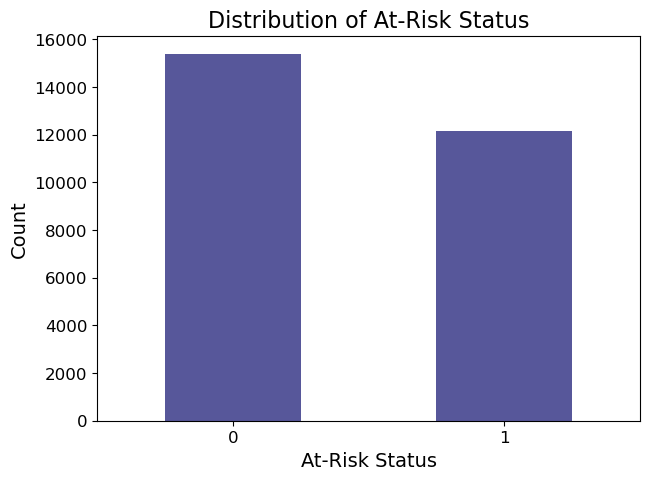

In [40]:
plt.figure(figsize=(7, 5))
sns.countplot(data=stud_info2, x='at_risk', color='navy', alpha=0.7, width=0.5)
plt.title('Distribution of At-Risk Status', fontsize=16)
plt.xlabel('At-Risk Status', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

In [41]:
# Check stats summary of regristered days 
stud_reg['date_registration'].describe()

count    32548.000000
mean       -69.411300
std         49.260522
min       -322.000000
25%       -100.000000
50%        -57.000000
75%        -29.000000
max        167.000000
Name: date_registration, dtype: float64

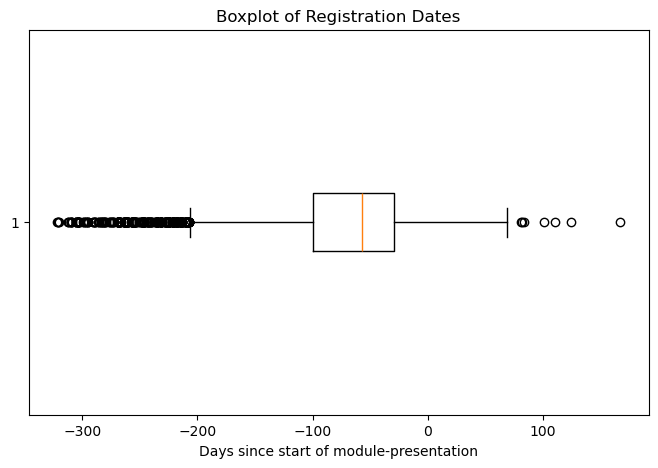

In [42]:
# Plot distribution for non-null unregistration dates
if stud_reg['date_registration'].notnull().any():
    plt.figure(figsize=(8, 5))
    plt.boxplot(stud_reg['date_registration'].dropna(), vert=False)
    plt.title('Boxplot of Registration Dates')
    plt.xlabel('Days since start of module-presentation')
    plt.show()
else:
    print("No registration dates available to plot.")

In [43]:
# Check for registration outliers (students who registered 1 month after the course started)
stud_reg[stud_reg['date_registration'] >= 28]

,code_module,code_presentation,id_student,date_registration,date_unregistration
160,AAA,2013J,341872,48.0,NaN
1154,BBB,2013B,442466,69.0,NaN
4554,BBB,2013J,1170618,32.0,NaN
4821,BBB,2014B,231959,81.0,NaN
4840,BBB,2014B,265958,59.0,NaN
7708,BBB,2014J,656352,44.0,NaN
10655,CCC,2014J,129198,37.0,173.0
11448,CCC,2014J,574891,37.0,119.0
13514,DDD,2013B,467413,49.0,NaN
13528,DDD,2013B,472949,124.0,NaN


## Create new columns / Feature engineering

In [44]:
stud_info2['age_band'].value_counts()

age_band
0-35     19187
35-55     8173
55<=       193
Name: count, dtype: int64

In [45]:
# Create a binary column to indicate if the student is above 35 years old
stud_info2['age_above_35'] = (stud_info2['age_band'] != '0-35').astype(int)
stud_info2['age_above_35'].value_counts()

age_above_35
0    19187
1     8366
Name: count, dtype: int64

In [46]:
# Group by 'id_student' and filter those groups having more than one entry
multiple_study_results = stud_info2.groupby('id_student').filter(lambda x: len(x) > 1)

# Order by 'id_student' and then by 'code_presentation'
multiple_study_results = multiple_study_results.sort_values(by=['id_student', 'code_presentation'])

multiple_study_results.shape

(5287, 17)

In [47]:
# Display the students with multiple study results
multiple_study_results.head(20)

,code_module,code_presentation,id_student,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,disability,final_result,imd_band_new,imd_band_group,outcome_3,at_risk,age_above_35
14396,DDD,2013J,27417,M,South West Region,Lower Than A Level,60-70%,0-35,0,60,N,Withdrawn,60-70%,over 50%,Withdrawn,1,0
17562,DDD,2014J,27417,M,South West Region,Lower Than A Level,60-70%,0-35,1,60,N,Withdrawn,60-70%,over 50%,Withdrawn,1,0
750,BBB,2013B,27891,M,Scotland,Lower Than A Level,0-10%,0-35,2,120,Y,Withdrawn,0-10%,up to 50%,Withdrawn,1,0
4754,BBB,2014B,27891,M,Scotland,Lower Than A Level,0-10%,0-35,4,120,Y,Fail,0-10%,up to 50%,Fail,1,0
14399,DDD,2013J,29411,M,East Midlands Region,A Level or Equivalent,80-90%,0-35,0,60,N,Pass,80-90%,over 50%,Success,0,0
10598,CCC,2014J,29411,M,East Midlands Region,A Level or Equivalent,80-90%,0-35,0,150,N,Withdrawn,80-90%,over 50%,Withdrawn,1,0
20417,EEE,2014B,29639,M,North Region,Lower Than A Level,NaN,0-35,0,30,N,Pass,unknown,unknown,Success,0,0
10600,CCC,2014J,29639,M,North Region,Lower Than A Level,NaN,0-35,0,30,N,Pass,unknown,unknown,Success,0,0
8659,CCC,2014B,29820,M,East Anglian Region,HE Qualification,40-50%,0-35,0,60,N,Pass,40-50%,up to 50%,Success,0,0
20418,EEE,2014B,29820,M,East Anglian Region,HE Qualification,40-50%,0-35,0,60,N,Pass,40-50%,up to 50%,Success,0,0


#### Dropping Year for Prediction: 
Dropping the year for prediction because this problem isn't a time-series problem. 

The prediction focus is on how student characteristics (e.g., demographics, learning activities, previous attempts) and module characteristics affect their outcome, regardless of the year. 

For future students, knowing the exact year is irrelevant to predicting their likelihood of passing or withdrawing. 

This keeps the model simpler and more generalisable for new student-module combinations.

In [48]:
# Extract year from code_presentations
stud_info2['year'] = stud_info2['code_presentation'].str[:4].astype(int)
stud_info2['presentation_month'] = stud_info2['code_presentation'].str[-1]
stud_info2.head()

,code_module,code_presentation,id_student,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,disability,final_result,imd_band_new,imd_band_group,outcome_3,at_risk,age_above_35,year,presentation_month
0,AAA,2013J,11391,M,East Anglian Region,HE Qualification,90-100%,55<=,0,240,N,Pass,90-100%,over 50%,Success,0,1,2013,J
1,AAA,2013J,28400,F,Scotland,HE Qualification,20-30%,35-55,0,60,N,Pass,20-30%,up to 50%,Success,0,1,2013,J
3,AAA,2013J,31604,F,South East Region,A Level or Equivalent,50-60%,35-55,0,60,N,Pass,50-60%,over 50%,Success,0,1,2013,J
4,AAA,2013J,32885,F,West Midlands Region,Lower Than A Level,50-60%,0-35,0,60,N,Pass,50-60%,over 50%,Success,0,0,2013,J
5,AAA,2013J,38053,M,Wales,A Level or Equivalent,80-90%,35-55,0,60,N,Pass,80-90%,over 50%,Success,0,1,2013,J


### Join tables to extract more information

In [49]:
# Check for missing values
stud_vle.isna().sum()

code_module          0
code_presentation    0
id_student           0
id_site              0
date                 0
sum_click            0
dtype: int64

In [50]:
vle.isna().sum()

id_site                 0
code_module             0
code_presentation       0
activity_type           0
week_from            5243
week_to              5243
dtype: int64

In [51]:
# Join stud_vle and vle to check activity type, keep all rows from stud_vle
stud_vle_m = stud_vle.merge(vle[['id_site', 'activity_type']], on='id_site', how='left')
stud_vle_m.isna().sum()

code_module          0
code_presentation    0
id_student           0
id_site              0
date                 0
sum_click            0
activity_type        0
dtype: int64

In [52]:
stud_vle_m.head(15)

,code_module,code_presentation,id_student,id_site,date,sum_click,activity_type
0,AAA,2013J,28400,546652,-10,4,forumng
1,AAA,2013J,28400,546652,-10,1,forumng
2,AAA,2013J,28400,546652,-10,1,forumng
3,AAA,2013J,28400,546614,-10,11,homepage
4,AAA,2013J,28400,546714,-10,1,oucontent
5,AAA,2013J,28400,546652,-10,8,forumng
6,AAA,2013J,28400,546876,-10,2,subpage
7,AAA,2013J,28400,546688,-10,15,oucontent
8,AAA,2013J,28400,546662,-10,17,oucontent
9,AAA,2013J,28400,546890,-10,1,url


In [53]:
stud_vle_m.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10655280 entries, 0 to 10655279
Data columns (total 7 columns):
 #   Column             Dtype 
---  ------             ----- 
 0   code_module        object
 1   code_presentation  object
 2   id_student         int64 
 3   id_site            int64 
 4   date               int64 
 5   sum_click          int64 
 6   activity_type      object
dtypes: int64(4), object(3)
memory usage: 569.1+ MB


In [54]:
# Check how frequently each student in each course and presentation interacted with the VLE materials
stud_vle_m.groupby(['code_module', 'code_presentation', 'id_student'])['date'].value_counts()


code_module  code_presentation  id_student  date
AAA          2013J              11391        242    27
                                             1      16
                                            -5      11
                                             0      10
                                             210    10
                                                    ..
GGG          2014J              2684003      144     3
                                             219     3
                                             107     2
                                             130     1
                                             194     1
Name: count, Length: 1808119, dtype: int64

In [55]:
# Filter for records where the date is within first 4 weeks of the start of the module-presentation
stud_vle_f4w = stud_vle_m[stud_vle_m['date'] < 28]
stud_vle_f4w.head(15)

,code_module,code_presentation,id_student,id_site,date,sum_click,activity_type
0,AAA,2013J,28400,546652,-10,4,forumng
1,AAA,2013J,28400,546652,-10,1,forumng
2,AAA,2013J,28400,546652,-10,1,forumng
3,AAA,2013J,28400,546614,-10,11,homepage
4,AAA,2013J,28400,546714,-10,1,oucontent
5,AAA,2013J,28400,546652,-10,8,forumng
6,AAA,2013J,28400,546876,-10,2,subpage
7,AAA,2013J,28400,546688,-10,15,oucontent
8,AAA,2013J,28400,546662,-10,17,oucontent
9,AAA,2013J,28400,546890,-10,1,url


In [56]:
# Calculate the total number of interactions or visits made on different days or at different times for each unique student/course/presentation combination
vle_interactions01 = stud_vle_m.groupby(['code_module', 'code_presentation', 'id_student'])['date'].size().reset_index(name='vle_access_times')
vle_interactions01.head(20)

,code_module,code_presentation,id_student,vle_access_times
0,AAA,2013J,11391,196
1,AAA,2013J,28400,430
2,AAA,2013J,30268,76
3,AAA,2013J,31604,663
4,AAA,2013J,32885,352
5,AAA,2013J,38053,723
6,AAA,2013J,45462,355
7,AAA,2013J,45642,531
8,AAA,2013J,52130,593
9,AAA,2013J,53025,904


In [57]:
# Calculate the total number of interactions or visits made on different days or at different times during the early stage for each unique student/course/presentation combination
vle_interactions1 = stud_vle_f4w.groupby(['code_module', 'code_presentation', 'id_student'])['date'].size().reset_index(name='vle_access_times_f4w')
vle_interactions1.head(20)

,code_module,code_presentation,id_student,vle_access_times_f4w
0,AAA,2013J,11391,60
1,AAA,2013J,28400,149
2,AAA,2013J,30268,76
3,AAA,2013J,31604,136
4,AAA,2013J,32885,151
5,AAA,2013J,38053,186
6,AAA,2013J,45462,86
7,AAA,2013J,45642,142
8,AAA,2013J,52130,104
9,AAA,2013J,53025,144


In [58]:
# Count the number of unique days each student interacted with the materials
## A measure of how frequent these interactions were during the course of the module/presentation, 
## since two students with the same number of clicks could have very different patterns of usage 
##  (e.g., all clicks in a single day vs. clicks spread over multiple days).
vle_interactions02 = stud_vle_m.groupby(['code_module', 'code_presentation', 'id_student'])['date'].nunique().reset_index(name='vle_active_days')
vle_interactions02.head()

,code_module,code_presentation,id_student,vle_active_days
0,AAA,2013J,11391,40
1,AAA,2013J,28400,80
2,AAA,2013J,30268,12
3,AAA,2013J,31604,123
4,AAA,2013J,32885,70


In [59]:
# Count the number of unique days each student interacted with the materials
## A measure of how frequent these interactions were during the early stage of the module/presentation, 
## since two students with the same number of clicks could have very different patterns of usage 
##  (e.g., all clicks in a single day vs. clicks spread over multiple days).
vle_interactions2 = stud_vle_f4w.groupby(['code_module', 'code_presentation', 'id_student'])['date'].nunique().reset_index(name='vle_active_days_f4w')
vle_interactions2.head()

,code_module,code_presentation,id_student,vle_active_days_f4w
0,AAA,2013J,11391,8
1,AAA,2013J,28400,18
2,AAA,2013J,30268,12
3,AAA,2013J,31604,21
4,AAA,2013J,32885,24


count    1.065528e+07
mean     3.716946e+00
std      8.849047e+00
min      1.000000e+00
25%      1.000000e+00
50%      2.000000e+00
75%      3.000000e+00
max      6.977000e+03
Name: sum_click, dtype: float64


<Axes: xlabel='sum_click'>

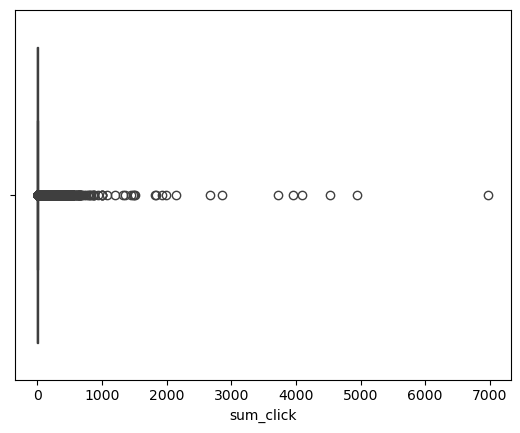

In [60]:
# Check the distribution of sum_click (number of clicks per access per activity)
print(stud_vle_m['sum_click'].describe())
sns.boxplot(x=stud_vle_m['sum_click'])

count    2.801311e+06
mean     3.544537e+00
std      7.554874e+00
min      1.000000e+00
25%      1.000000e+00
50%      2.000000e+00
75%      3.000000e+00
max      4.098000e+03
Name: sum_click, dtype: float64


<Axes: xlabel='sum_click'>

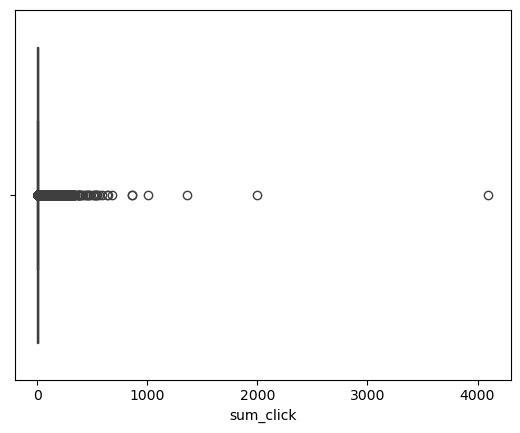

In [61]:
# Check the distribution of sum_click (number of clicks per access per activity)
print(stud_vle_f4w['sum_click'].describe())
sns.boxplot(x=stud_vle_f4w['sum_click'])

In [62]:
# Check the top percentile of sum_click
np.percentile(stud_vle_m['sum_click'], 99.9)

88.0

In [63]:
# Check the top percentile of sum_click
np.percentile(stud_vle_f4w['sum_click'], 99.9)

82.0

In [64]:
# Chech the rows with extremely high sum_click
# e.g. a student who studied 8 hours a day, clicking more than 100 times per hour for an activity, 
# which is unlikely (though possible before exams or assignments due date).
stud_vle_m[stud_vle_m['sum_click']  > 800] 

,code_module,code_presentation,id_student,id_site,date,sum_click,activity_type
121977,AAA,2013J,1894188,546703,155,1326,oucontent
1654069,BBB,2014J,642122,913504,55,931,oucontent
1705569,BBB,2014J,633902,913490,97,1076,oucontent
1739619,BBB,2014J,652969,913490,115,872,oucontent
1744198,BBB,2014J,687378,913671,118,2664,resource
2094681,CCC,2014B,582087,729844,45,998,oucontent
2113903,CCC,2014B,582087,729813,56,1517,oucontent
2222490,CCC,2014B,582087,729815,117,1481,oucontent
2315591,CCC,2014B,285170,729809,180,997,oucontent
2377671,CCC,2014B,285170,729821,216,871,oucontent


<Axes: xlabel='sum_click_capped'>

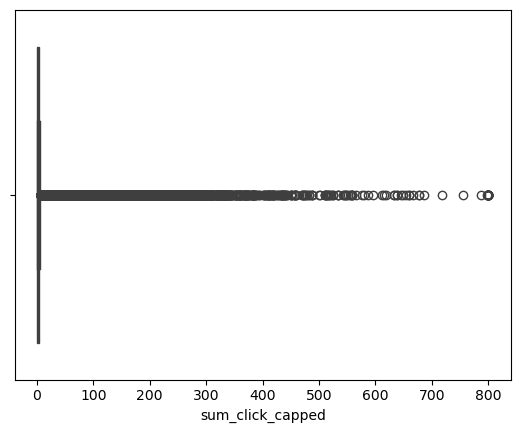

In [65]:
# The extremely high sum_click values are a small portion of the whole dataset
# We will cap the sum_click at 800 to reduce the influence of extreme outliers while preserving relevant information.
stud_vle_m['sum_click_capped'] = stud_vle_m['sum_click'].clip(upper=800)

# Check distribution after capping
sns.boxplot(x=stud_vle_m['sum_click_capped'])

In [66]:
# Chech the rows with extremely high sum_click
# e.g. a student who studied 6 hours a day, clicking more than 100 times per hour for an activity, 
# which is unlikely (though possible before exams or assignments due date).
stud_vle_f4w[stud_vle_f4w['sum_click']  > 600] 

,code_module,code_presentation,id_student,id_site,date,sum_click,activity_type
2441827,CCC,2014J,678395,909096,-7,633,quiz
2442394,CCC,2014J,678395,909096,-6,1003,quiz
2597086,CCC,2014J,605868,909298,27,1996,resource
5695354,EEE,2014B,625527,790732,25,678,homepage
6331815,FFF,2013B,497180,526721,1,4098,homepage
7256258,FFF,2013J,491011,716238,-4,1357,homepage
8394700,FFF,2014B,623948,779582,-9,864,resource
8394706,FFF,2014B,623948,779581,-9,864,resource
8465952,FFF,2014B,400252,779259,9,639,quiz


<Axes: xlabel='sum_click_capped_f4w'>

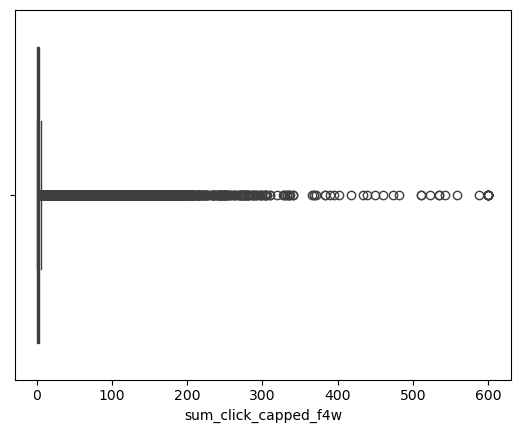

In [67]:
# While it is possible for students to spend a lot of time doing online quizzes, it is unusual for them to have such high numbers of clicks for browsing activities.
# We will cap the sum_click at 600 to reduce the influence of extreme outliers while preserving relevant information.
stud_vle_f4w['sum_click_capped_f4w'] = stud_vle_f4w['sum_click'].clip(upper=600)

# Check distribution after capping
sns.boxplot(x=stud_vle_f4w['sum_click_capped_f4w'])

In [68]:
# Calculate total interactions/access times, unique interaction/active days, and total sum_click for the whole course/presentation duration in one groupby operation
vle_interactions03 = stud_vle_m.groupby(['code_module', 'code_presentation', 'id_student']).agg(
    vle_access_times_all=('date', 'size'),               # Total number of interactions (1 row per access)
    vle_active_days_all=('date', 'nunique'),             # Number of unique days with active interactions
    total_click=('sum_click_capped', 'sum')          # Total number of clicks
).reset_index()
vle_interactions03.head(10)

,code_module,code_presentation,id_student,vle_access_times_all,vle_active_days_all,total_click
0,AAA,2013J,11391,196,40,934
1,AAA,2013J,28400,430,80,1435
2,AAA,2013J,30268,76,12,281
3,AAA,2013J,31604,663,123,2158
4,AAA,2013J,32885,352,70,1034
5,AAA,2013J,38053,723,143,2445
6,AAA,2013J,45462,355,90,1492
7,AAA,2013J,45642,531,105,1428
8,AAA,2013J,52130,593,122,1894
9,AAA,2013J,53025,904,142,3158


In [69]:
# Calculate total interactions/access times, unique interaction/active days, and total sum_click for the first 4 weeks in one groupby operation
vle_interactions3 = stud_vle_f4w.groupby(['code_module', 'code_presentation', 'id_student']).agg(
    vle_access_times_f4w=('date', 'size'),               # Total number of interactions (1 row per access)
    vle_active_days_f4w=('date', 'nunique'),             # Number of unique days with active interactions
    total_click_f4w=('sum_click_capped_f4w', 'sum')      # Total number of clicks
).reset_index()
vle_interactions3.head(10)

,code_module,code_presentation,id_student,vle_access_times_f4w,vle_active_days_f4w,total_click_f4w
0,AAA,2013J,11391,60,8,401
1,AAA,2013J,28400,149,18,550
2,AAA,2013J,30268,76,12,281
3,AAA,2013J,31604,136,21,478
4,AAA,2013J,32885,151,24,567
5,AAA,2013J,38053,186,32,727
6,AAA,2013J,45462,86,14,499
7,AAA,2013J,45642,142,18,409
8,AAA,2013J,52130,104,17,351
9,AAA,2013J,53025,144,19,558


In [70]:
# stud_vle_f4w.shape

In [71]:
# Check the variety of the vle acitivities each student in each course and presentation interacted
stud_vle_m.groupby(['code_module', 'code_presentation', 'id_student'])['activity_type'].value_counts()

code_module  code_presentation  id_student  activity_type
AAA          2013J              11391       oucontent        78
                                            forumng          52
                                            homepage         40
                                            subpage          11
                                            resource         11
                                                             ..
GGG          2014J              2684003     oucontent        38
                                            homepage         34
                                            quiz             27
                                            subpage          20
                                            resource         10
Name: count, Length: 240357, dtype: int64

In [72]:
# Check the variety of the vle acitivities each student in each course and presentation interacted for the first 4 weeks
stud_vle_f4w.groupby(['code_module', 'code_presentation', 'id_student'])['activity_type'].value_counts()

code_module  code_presentation  id_student  activity_type
AAA          2013J              11391       oucontent        26
                                            forumng          14
                                            homepage          8
                                            resource          7
                                            subpage           4
                                                             ..
GGG          2014J              2684003     homepage         17
                                            subpage          12
                                            resource          7
                                            oucontent         4
                                            quiz              2
Name: count, Length: 200918, dtype: int64

In [73]:
# count the number of unique activity_types for each student/module/presentation combination for the first 4 weeks, but only include activities that were accessed frequently

# Group by student/module/presentation and count the number of times each activity_type appears
activity_counts_f4w = stud_vle_f4w.groupby(['code_module', 'code_presentation', 'id_student', 'activity_type']).size().reset_index(name='activity_count')

# Filter the activities that were accessed more than a threshold 
frequent_activities_f4w = activity_counts_f4w[activity_counts_f4w['activity_count'] >= 5]

# Group by student/module/presentation and count the number of unique activity_types that meet the threshold criteria
frequent_activity_variety_f4w = frequent_activities_f4w.groupby(['code_module', 'code_presentation', 'id_student'])['activity_type'].nunique().reset_index(name='frequent_activity_variety_f4w')

# Join back into the vle_interactions3 dataframe
vle_interactions4 = vle_interactions3.merge(frequent_activity_variety_f4w, on=['code_module', 'code_presentation', 'id_student'], how='left')

# Fill NaN with 0 for rows didn't meet the frequent activity threshold
vle_interactions4['frequent_activity_variety_f4w'].fillna(0, inplace=True)

# Verify the result
vle_interactions4.head(10)


,code_module,code_presentation,id_student,vle_access_times_f4w,vle_active_days_f4w,total_click_f4w,frequent_activity_variety_f4w
0,AAA,2013J,11391,60,8,401,4.0
1,AAA,2013J,28400,149,18,550,6.0
2,AAA,2013J,30268,76,12,281,4.0
3,AAA,2013J,31604,136,21,478,6.0
4,AAA,2013J,32885,151,24,567,6.0
5,AAA,2013J,38053,186,32,727,5.0
6,AAA,2013J,45462,86,14,499,5.0
7,AAA,2013J,45642,142,18,409,5.0
8,AAA,2013J,52130,104,17,351,5.0
9,AAA,2013J,53025,144,19,558,5.0


In [74]:
vle_interactions03.shape

(29228, 6)

In [75]:
vle_interactions4.shape

(28774, 7)

In [76]:
# Calculate the total clicks for each student/module/presentation combination within the first two weeks of the course (i.e., date < 14):

# Filter data for clicks within the first two weeks (date < 14)
first_two_weeks_clicks = stud_vle_f4w[stud_vle_f4w['date'] < 14]

# Group by code_module, code_presentation, and id_student and calculate the total sum_click for this filtered data
first_two_weeks_interactions = first_two_weeks_clicks.groupby(['code_module', 'code_presentation', 'id_student'])['sum_click_capped_f4w'].sum().reset_index(name='total_click_first_2_weeks')

# Join back to the main vle_interactions dataframe 
vle_interactions5 = vle_interactions4.merge(first_two_weeks_interactions, on=['code_module', 'code_presentation', 'id_student'], how='left')

# If any students didn't interact in the first 2 weeks, replace NaN with 0
vle_interactions5['total_click_first_2_weeks'].fillna(0, inplace=True)

vle_interactions5.head(10)


,code_module,code_presentation,id_student,vle_access_times_f4w,vle_active_days_f4w,total_click_f4w,frequent_activity_variety_f4w,total_click_first_2_weeks
0,AAA,2013J,11391,60,8,401,4.0,301.0
1,AAA,2013J,28400,149,18,550,6.0,456.0
2,AAA,2013J,30268,76,12,281,4.0,281.0
3,AAA,2013J,31604,136,21,478,6.0,345.0
4,AAA,2013J,32885,151,24,567,6.0,472.0
5,AAA,2013J,38053,186,32,727,5.0,553.0
6,AAA,2013J,45462,86,14,499,5.0,254.0
7,AAA,2013J,45642,142,18,409,5.0,122.0
8,AAA,2013J,52130,104,17,351,5.0,97.0
9,AAA,2013J,53025,144,19,558,5.0,382.0


In [77]:
vle_interactions5.shape

(28774, 8)

In [78]:
stud_vle_m['activity_type'].value_counts()

activity_type
forumng           2408457
oucontent         1963782
subpage           1949898
homepage          1735226
quiz               914573
resource           813185
url                407716
ouwiki             178165
oucollaborate       65793
externalquiz        50910
page                47549
questionnaire       44905
ouelluminate        22360
glossary            17435
dataplus            13506
dualpane            10153
htmlactivity         6835
folder               4678
sharedsubpage         148
repeatactivity          6
Name: count, dtype: int64

In [79]:
stud_vle_f4w['activity_type'].value_counts()

activity_type
forumng          673802
subpage          589219
oucontent        432317
homepage         394181
resource         277938
quiz             158507
url              152205
ouwiki            45436
page              25496
oucollaborate     14129
externalquiz      13008
ouelluminate       8285
glossary           6180
htmlactivity       6082
questionnaire      2561
dualpane           1704
dataplus            179
sharedsubpage        82
Name: count, dtype: int64

### Handling different acitvity types:
1. Group the lesser frequent activity_type as 'others'.
2. Pivot the DataFrame to calculate the total sum_click for each activity_type, while keeping only the top 12 activity types in separate columns and grouping the rest as "others".
3. Create a new DataFrame where each student/module/presentation combination has columns for total clicks per activity type.

In [80]:
# Group rare activity types as 'others'
# Get the top most frequent activity types
top_activities = stud_vle_f4w['activity_type'].value_counts().nlargest(10).index

# Create a new column that groups rare activities 
stud_vle_f4w['activity_type_grouped'] = stud_vle_f4w['activity_type'].apply(lambda x: x if x in top_activities else 'less_common_vle')

# Calculate total sum_click for each activity type per student/module/presentation combination
# Use pivot_table to aggregate sum_click by student/module/presentation and activity_type
pivot_table_f4w = stud_vle_f4w.pivot_table(
    index=['code_module', 'code_presentation', 'id_student'],  # Group by student/module/presentation
    columns='activity_type_grouped',                           # Pivot by activity type
    values='sum_click_capped_f4w',                     # The value to aggregate is 'sum_click'
    aggfunc='sum',                                     # Aggregate using the sum of sum_click
    fill_value=0                                       # Fill missing values with 0 (no clicks for that activity)
).reset_index()

# Rename the columns to reflect activity type names
# pivot_table_f4w.columns = ['_'.join(col).strip() if isinstance(col, tuple) else col for col in pivot_table_f4w.columns]

# View the result
pivot_table_f4w.head()


activity_type_grouped,code_module,code_presentation,id_student,forumng,homepage,less_common_vle,oucollaborate,oucontent,ouwiki,page,quiz,resource,subpage,url
0,AAA,2013J,11391,55,42,0,0,273,0,0,0,9,21,1
1,AAA,2013J,28400,204,121,0,0,138,0,0,0,5,55,27
2,AAA,2013J,30268,126,59,0,0,66,0,0,0,4,22,4
3,AAA,2013J,31604,131,94,1,0,175,0,0,0,10,50,17
4,AAA,2013J,32885,138,102,2,0,284,0,0,0,7,28,6


In [81]:
pivot_table_f4w.columns

Index(['code_module', 'code_presentation', 'id_student', 'forumng', 'homepage',
       'less_common_vle', 'oucollaborate', 'oucontent', 'ouwiki', 'page',
       'quiz', 'resource', 'subpage', 'url'],
      dtype='object', name='activity_type_grouped')

In [82]:
# pivot_table_f4w.info()

In [83]:
# Join vle_interactions and pivot_table to get the first 4 weeks vle interactions
vle_interactions_f4w = vle_interactions5.merge(pivot_table_f4w, 
       on=['code_module', 'code_presentation', 'id_student'], 
       how='left')

In [84]:
vle_interactions_f4w.head(10)

,code_module,code_presentation,id_student,vle_access_times_f4w,vle_active_days_f4w,total_click_f4w,frequent_activity_variety_f4w,total_click_first_2_weeks,forumng,homepage,less_common_vle,oucollaborate,oucontent,ouwiki,page,quiz,resource,subpage,url
0,AAA,2013J,11391,60,8,401,4.0,301.0,55,42,0,0,273,0,0,0,9,21,1
1,AAA,2013J,28400,149,18,550,6.0,456.0,204,121,0,0,138,0,0,0,5,55,27
2,AAA,2013J,30268,76,12,281,4.0,281.0,126,59,0,0,66,0,0,0,4,22,4
3,AAA,2013J,31604,136,21,478,6.0,345.0,131,94,1,0,175,0,0,0,10,50,17
4,AAA,2013J,32885,151,24,567,6.0,472.0,138,102,2,0,284,0,0,0,7,28,6
5,AAA,2013J,38053,186,32,727,5.0,553.0,341,174,0,0,164,0,0,0,6,31,11
6,AAA,2013J,45462,86,14,499,5.0,254.0,49,89,0,2,310,0,0,0,4,38,7
7,AAA,2013J,45642,142,18,409,5.0,122.0,163,79,0,1,111,0,0,0,3,36,16
8,AAA,2013J,52130,104,17,351,5.0,97.0,73,87,0,2,122,0,0,0,2,45,20
9,AAA,2013J,53025,144,19,558,5.0,382.0,292,58,0,0,156,0,0,0,4,33,15


In [85]:
vle_interactions_f4w.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28774 entries, 0 to 28773
Data columns (total 19 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   code_module                    28774 non-null  object 
 1   code_presentation              28774 non-null  object 
 2   id_student                     28774 non-null  int64  
 3   vle_access_times_f4w           28774 non-null  int64  
 4   vle_active_days_f4w            28774 non-null  int64  
 5   total_click_f4w                28774 non-null  int64  
 6   frequent_activity_variety_f4w  28774 non-null  float64
 7   total_click_first_2_weeks      28774 non-null  float64
 8   forumng                        28774 non-null  int64  
 9   homepage                       28774 non-null  int64  
 10  less_common_vle                28774 non-null  int64  
 11  oucollaborate                  28774 non-null  int64  
 12  oucontent                      28774 non-null 

In [86]:
vle_interactions03.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29228 entries, 0 to 29227
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   code_module           29228 non-null  object
 1   code_presentation     29228 non-null  object
 2   id_student            29228 non-null  int64 
 3   vle_access_times_all  29228 non-null  int64 
 4   vle_active_days_all   29228 non-null  int64 
 5   total_click           29228 non-null  int64 
dtypes: int64(4), object(2)
memory usage: 1.3+ MB


In [87]:
# Join the vle_interactions03 (overall vle interactions) and the first 4 weeks data to get the full vle interactions
vle_interactions_full = vle_interactions03.merge(vle_interactions_f4w, 
       on=['code_module', 'code_presentation', 'id_student'], 
       how='left')
vle_interactions_full.head(10)

,code_module,code_presentation,id_student,vle_access_times_all,vle_active_days_all,total_click,vle_access_times_f4w,vle_active_days_f4w,total_click_f4w,frequent_activity_variety_f4w,...,homepage,less_common_vle,oucollaborate,oucontent,ouwiki,page,quiz,resource,subpage,url
0,AAA,2013J,11391,196,40,934,60.0,8.0,401.0,4.0,...,42.0,0.0,0.0,273.0,0.0,0.0,0.0,9.0,21.0,1.0
1,AAA,2013J,28400,430,80,1435,149.0,18.0,550.0,6.0,...,121.0,0.0,0.0,138.0,0.0,0.0,0.0,5.0,55.0,27.0
2,AAA,2013J,30268,76,12,281,76.0,12.0,281.0,4.0,...,59.0,0.0,0.0,66.0,0.0,0.0,0.0,4.0,22.0,4.0
3,AAA,2013J,31604,663,123,2158,136.0,21.0,478.0,6.0,...,94.0,1.0,0.0,175.0,0.0,0.0,0.0,10.0,50.0,17.0
4,AAA,2013J,32885,352,70,1034,151.0,24.0,567.0,6.0,...,102.0,2.0,0.0,284.0,0.0,0.0,0.0,7.0,28.0,6.0
5,AAA,2013J,38053,723,143,2445,186.0,32.0,727.0,5.0,...,174.0,0.0,0.0,164.0,0.0,0.0,0.0,6.0,31.0,11.0
6,AAA,2013J,45462,355,90,1492,86.0,14.0,499.0,5.0,...,89.0,0.0,2.0,310.0,0.0,0.0,0.0,4.0,38.0,7.0
7,AAA,2013J,45642,531,105,1428,142.0,18.0,409.0,5.0,...,79.0,0.0,1.0,111.0,0.0,0.0,0.0,3.0,36.0,16.0
8,AAA,2013J,52130,593,122,1894,104.0,17.0,351.0,5.0,...,87.0,0.0,2.0,122.0,0.0,0.0,0.0,2.0,45.0,20.0
9,AAA,2013J,53025,904,142,3158,144.0,19.0,558.0,5.0,...,58.0,0.0,0.0,156.0,0.0,0.0,0.0,4.0,33.0,15.0


In [88]:
vle_interactions_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29228 entries, 0 to 29227
Data columns (total 22 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   code_module                    29228 non-null  object 
 1   code_presentation              29228 non-null  object 
 2   id_student                     29228 non-null  int64  
 3   vle_access_times_all           29228 non-null  int64  
 4   vle_active_days_all            29228 non-null  int64  
 5   total_click                    29228 non-null  int64  
 6   vle_access_times_f4w           28774 non-null  float64
 7   vle_active_days_f4w            28774 non-null  float64
 8   total_click_f4w                28774 non-null  float64
 9   frequent_activity_variety_f4w  28774 non-null  float64
 10  total_click_first_2_weeks      28774 non-null  float64
 11  forumng                        28774 non-null  float64
 12  homepage                       28774 non-null 

In [89]:
# Join stud_info and vle_interactions
# stud_info_vle_4w = stud_info.merge(vle_interactions_f4w, on=['code_module', 'code_presentation', 'id_student'], how='left')
stud_info_vle_full = stud_info2.merge(vle_interactions_full, on=['code_module', 'code_presentation', 'id_student'], how='left')
stud_info_vle_full.head(10)

,code_module,code_presentation,id_student,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,...,homepage,less_common_vle,oucollaborate,oucontent,ouwiki,page,quiz,resource,subpage,url
0,AAA,2013J,11391,M,East Anglian Region,HE Qualification,90-100%,55<=,0,240,...,42.0,0.0,0.0,273.0,0.0,0.0,0.0,9.0,21.0,1.0
1,AAA,2013J,28400,F,Scotland,HE Qualification,20-30%,35-55,0,60,...,121.0,0.0,0.0,138.0,0.0,0.0,0.0,5.0,55.0,27.0
2,AAA,2013J,31604,F,South East Region,A Level or Equivalent,50-60%,35-55,0,60,...,94.0,1.0,0.0,175.0,0.0,0.0,0.0,10.0,50.0,17.0
3,AAA,2013J,32885,F,West Midlands Region,Lower Than A Level,50-60%,0-35,0,60,...,102.0,2.0,0.0,284.0,0.0,0.0,0.0,7.0,28.0,6.0
4,AAA,2013J,38053,M,Wales,A Level or Equivalent,80-90%,35-55,0,60,...,174.0,0.0,0.0,164.0,0.0,0.0,0.0,6.0,31.0,11.0
5,AAA,2013J,45462,M,Scotland,HE Qualification,30-40%,0-35,0,60,...,89.0,0.0,2.0,310.0,0.0,0.0,0.0,4.0,38.0,7.0
6,AAA,2013J,45642,F,North Western Region,A Level or Equivalent,90-100%,0-35,0,120,...,79.0,0.0,1.0,111.0,0.0,0.0,0.0,3.0,36.0,16.0
7,AAA,2013J,52130,F,East Anglian Region,A Level or Equivalent,70-80%,0-35,0,90,...,87.0,0.0,2.0,122.0,0.0,0.0,0.0,2.0,45.0,20.0
8,AAA,2013J,53025,M,North Region,Post Graduate Qualification,NaN,55<=,0,60,...,58.0,0.0,0.0,156.0,0.0,0.0,0.0,4.0,33.0,15.0
9,AAA,2013J,57506,M,South Region,Lower Than A Level,70-80%,35-55,0,60,...,131.0,0.0,0.0,297.0,0.0,0.0,0.0,2.0,54.0,25.0


In [90]:
# Check assessment data
assessments.info()
assessments.tail(20)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 206 entries, 0 to 205
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   code_module        206 non-null    object 
 1   code_presentation  206 non-null    object 
 2   id_assessment      206 non-null    int64  
 3   assessment_type    206 non-null    object 
 4   date               195 non-null    float64
 5   weight             206 non-null    float64
dtypes: float64(2), int64(1), object(3)
memory usage: 9.8+ KB


,code_module,code_presentation,id_assessment,assessment_type,date,weight
186,GGG,2014B,37428,CMA,222.0,0.0
187,GGG,2014B,37429,CMA,222.0,0.0
188,GGG,2014B,37430,CMA,222.0,0.0
189,GGG,2014B,37431,CMA,222.0,0.0
190,GGG,2014B,37432,CMA,222.0,0.0
191,GGG,2014B,37433,CMA,222.0,0.0
192,GGG,2014B,37425,TMA,61.0,0.0
193,GGG,2014B,37426,TMA,117.0,0.0
194,GGG,2014B,37427,TMA,166.0,0.0
195,GGG,2014B,37434,Exam,222.0,100.0


In [91]:
# Check the earliest assessment (excluding Exam) for each module/presentation
print(assessments[assessments['assessment_type'] != 'Exam'].groupby(['code_module', 'code_presentation'])['date'].min())
## show all the relevant columns for that row
first_assessment = assessments[assessments['assessment_type'] != 'Exam'].groupby(['code_module', 'code_presentation']).apply(lambda x: x.loc[x['date'].idxmin()])

# Reset the index to avoid duplicate index columns in the result
first_assessment = first_assessment.reset_index(drop=True)

first_assessment


code_module  code_presentation
AAA          2013J                19.0
             2014J                19.0
BBB          2013B                19.0
             2013J                19.0
             2014B                12.0
             2014J                19.0
CCC          2014B                18.0
             2014J                18.0
DDD          2013B                23.0
             2013J                25.0
             2014B                25.0
             2014J                20.0
EEE          2013J                33.0
             2014B                33.0
             2014J                33.0
FFF          2013B                19.0
             2013J                19.0
             2014B                24.0
             2014J                24.0
GGG          2013J                61.0
             2014B                61.0
             2014J                61.0
Name: date, dtype: float64


,code_module,code_presentation,id_assessment,assessment_type,date,weight
0,AAA,2013J,1752,TMA,19.0,10.0
1,AAA,2014J,1758,TMA,19.0,10.0
2,BBB,2013B,14984,TMA,19.0,5.0
3,BBB,2013J,14996,TMA,19.0,5.0
4,BBB,2014B,15008,TMA,12.0,5.0
5,BBB,2014J,15020,TMA,19.0,0.0
6,CCC,2014B,24286,CMA,18.0,2.0
7,CCC,2014J,24295,CMA,18.0,2.0
8,DDD,2013B,25341,CMA,23.0,2.0
9,DDD,2013J,25348,TMA,25.0,10.0


In [92]:
# Check if the first assessment i within the first 4 weeks of the course
first_assessment['assessment1_within_f4w'] = first_assessment['date'].apply(lambda x: 1 if x < 28 else 0 )

# Create a new column to indicate the first assessment type
first_assessment['assessment1_is_tma'] = first_assessment['assessment_type'].apply(lambda x: 1 if x == 'TMA' else 0)

# Rename weight column 
first_assessment.rename(columns={'weight': 'assessment1_weight'}, inplace=True)

first_assessment


,code_module,code_presentation,id_assessment,assessment_type,date,assessment1_weight,assessment1_within_f4w,assessment1_is_tma
0,AAA,2013J,1752,TMA,19.0,10.0,1,1
1,AAA,2014J,1758,TMA,19.0,10.0,1,1
2,BBB,2013B,14984,TMA,19.0,5.0,1,1
3,BBB,2013J,14996,TMA,19.0,5.0,1,1
4,BBB,2014B,15008,TMA,12.0,5.0,1,1
5,BBB,2014J,15020,TMA,19.0,0.0,1,1
6,CCC,2014B,24286,CMA,18.0,2.0,1,0
7,CCC,2014J,24295,CMA,18.0,2.0,1,0
8,DDD,2013B,25341,CMA,23.0,2.0,1,0
9,DDD,2013J,25348,TMA,25.0,10.0,1,1


In [93]:
print(stud_assm.info())
print(stud_assm.describe())
stud_assm.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 173912 entries, 0 to 173911
Data columns (total 5 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   id_assessment   173912 non-null  int64  
 1   id_student      173912 non-null  int64  
 2   date_submitted  173912 non-null  int64  
 3   is_banked       173912 non-null  int64  
 4   score           173739 non-null  float64
dtypes: float64(1), int64(4)
memory usage: 6.6 MB
None
       id_assessment    id_student  date_submitted      is_banked  \
count  173912.000000  1.739120e+05   173912.000000  173912.000000   
mean    26553.803556  7.051507e+05      116.032942       0.010977   
std      8829.784254  5.523952e+05       71.484148       0.104194   
min      1752.000000  6.516000e+03      -11.000000       0.000000   
25%     15022.000000  5.044290e+05       51.000000       0.000000   
50%     25359.000000  5.852080e+05      116.000000       0.000000   
75%     34883.000000  6.344980

,id_assessment,id_student,date_submitted,is_banked,score
0,1752,11391,18,0,78.0
1,1752,28400,22,0,70.0
2,1752,31604,17,0,72.0
3,1752,32885,26,0,69.0
4,1752,38053,19,0,79.0


In [94]:
# Join the tables to get students' assessment1 information
stud_assm1 = stud_assm.merge(first_assessment[['id_assessment', 'code_module', 'code_presentation', 
                                               'assessment1_weight', 'assessment1_within_f4w', 'assessment1_is_tma']],
                                on=['id_assessment',], how='left')
stud_assm1.head()

,id_assessment,id_student,date_submitted,is_banked,score,code_module,code_presentation,assessment1_weight,assessment1_within_f4w,assessment1_is_tma
0,1752,11391,18,0,78.0,AAA,2013J,10.0,1.0,1.0
1,1752,28400,22,0,70.0,AAA,2013J,10.0,1.0,1.0
2,1752,31604,17,0,72.0,AAA,2013J,10.0,1.0,1.0
3,1752,32885,26,0,69.0,AAA,2013J,10.0,1.0,1.0
4,1752,38053,19,0,79.0,AAA,2013J,10.0,1.0,1.0


In [95]:
# Check the number of different assessment types for each course/presentation
assessments.groupby(['code_module', 'code_presentation'])['assessment_type'].value_counts().unstack().fillna(0)

assessment_type                CMA  Exam  TMA
code_module code_presentation                
AAA         2013J              0.0   1.0  5.0
            2014J              0.0   1.0  5.0
BBB         2013B              5.0   1.0  6.0
            2013J              5.0   1.0  6.0
            2014B              5.0   1.0  6.0
            2014J              0.0   1.0  5.0
CCC         2014B              4.0   2.0  4.0
            2014J              4.0   2.0  4.0
DDD         2013B              7.0   1.0  6.0
            2013J              0.0   1.0  6.0
            2014B              0.0   1.0  6.0
            2014J              0.0   1.0  6.0
EEE         2013J              0.0   1.0  4.0
            2014B              0.0   1.0  4.0
            2014J              0.0   1.0  4.0
FFF         2013B              7.0   1.0  5.0
            2013J              7.0   1.0  5.0
            2014B              7.0   1.0  5.0
            2014J              7.0   1.0  5.0
GGG         2013J              6.0   1.0  3.0
            2014B              6.0   1.0  3.0
            2014J              6.0   1.0  3.0

#### Observation:
All of them have TMA (by tutor) and Exam, some of them do not have CMA (by computer)

In [96]:
# Create the grouped and unstacked dataframe
assessments01 = assessments.groupby(['code_module', 'code_presentation'])['assessment_type'].value_counts().unstack().fillna(0)

# Drop the "Exam" column
assessments01 = assessments01.drop(columns='Exam')

# Rename the remaining columns
assessments01 = assessments01.rename(columns={'CMA': 'cma_count', 'TMA': 'tma_count'})

# Display the updated dataframe showing the number of CMAs and TMAs for each course/presentation
assessments01

assessment_type                cma_count  tma_count
code_module code_presentation                      
AAA         2013J                    0.0        5.0
            2014J                    0.0        5.0
BBB         2013B                    5.0        6.0
            2013J                    5.0        6.0
            2014B                    5.0        6.0
            2014J                    0.0        5.0
CCC         2014B                    4.0        4.0
            2014J                    4.0        4.0
DDD         2013B                    7.0        6.0
            2013J                    0.0        6.0
            2014B                    0.0        6.0
            2014J                    0.0        6.0
EEE         2013J                    0.0        4.0
            2014B                    0.0        4.0
            2014J                    0.0        4.0
FFF         2013B                    7.0        5.0
            2013J                    7.0        5.0
            2014B                    7.0        5.0
            2014J                    7.0        5.0
GGG         2013J                    6.0        3.0
            2014B                    6.0        3.0
            2014J                    6.0        3.0

In [97]:
# Check the total weight of each assessment type for each course/presentation
assessments.groupby(['code_module', 'code_presentation', 'assessment_type'])['weight'].sum().unstack().fillna(0)

assessment_type                 CMA   Exam    TMA
code_module code_presentation                    
AAA         2013J               0.0  100.0  100.0
            2014J               0.0  100.0  100.0
BBB         2013B               5.0  100.0   95.0
            2013J               5.0  100.0   95.0
            2014B               5.0  100.0   95.0
            2014J               0.0  100.0  100.0
CCC         2014B              25.0  200.0   75.0
            2014J              25.0  200.0   75.0
DDD         2013B              25.0  100.0   75.0
            2013J               0.0  100.0  100.0
            2014B               0.0  100.0  100.0
            2014J               0.0  100.0  100.0
EEE         2013J               0.0  100.0  100.0
            2014B               0.0  100.0  100.0
            2014J               0.0  100.0  100.0
FFF         2013B               0.0  100.0  100.0
            2013J               0.0  100.0  100.0
            2014B               0.0  100.0  100.0
            2014J               0.0  100.0  100.0
GGG         2013J               0.0  100.0    0.0
            2014B               0.0  100.0    0.0
            2014J               0.0  100.0    0.0

### Observation: 
The weights of TMA and CMA for each module/presentation usually add up to 100, except for module GGG


In [98]:
# Calculate the total weight of TMAs & CMAs for each course/presentation

# Filter for TMA and CMA assessments
tma_cma_assessments = assessments[assessments['assessment_type'].isin(['TMA', 'CMA'])]

# Group by code_module and code_presentation and sum the weight for both TMA and CMA
tma_cma_total_weight = tma_cma_assessments.groupby(['code_module', 'code_presentation', 'assessment_type'])['weight'].sum().unstack().fillna(0).reset_index()

# Rename columns 
tma_cma_total_weight = tma_cma_total_weight.rename(columns={'TMA': 'tma_total_weight', 'CMA': 'cma_total_weight'})

# Add the ratio of cma weight to tma weight, and if they are both 0, set the ratio to 1
tma_cma_total_weight['cma_tma_weight_ratio'] = tma_cma_total_weight.apply(
    lambda row: row['cma_total_weight'] / row['tma_total_weight'] if row['tma_total_weight'] != 0 else (1 if row['cma_total_weight'] == 0 else float('inf')),
    axis=1
)

tma_cma_total_weight


assessment_type,code_module,code_presentation,cma_total_weight,tma_total_weight,cma_tma_weight_ratio
0,AAA,2013J,0.0,100.0,0.000000
1,AAA,2014J,0.0,100.0,0.000000
2,BBB,2013B,5.0,95.0,0.052632
3,BBB,2013J,5.0,95.0,0.052632
4,BBB,2014B,5.0,95.0,0.052632
5,BBB,2014J,0.0,100.0,0.000000
6,CCC,2014B,25.0,75.0,0.333333
7,CCC,2014J,25.0,75.0,0.333333
8,DDD,2013B,25.0,75.0,0.333333
9,DDD,2013J,0.0,100.0,0.000000


In [99]:
tma_cma_total_weight.columns

Index(['code_module', 'code_presentation', 'cma_total_weight',
       'tma_total_weight', 'cma_tma_weight_ratio'],
      dtype='object', name='assessment_type')

In [100]:
# Join the above 2 dataframes
assessments02 = assessments01.merge(tma_cma_total_weight, on=['code_module', 'code_presentation'], how='left')
assessments02.head()

assessment_type,code_module,code_presentation,cma_count,tma_count,cma_total_weight,tma_total_weight,cma_tma_weight_ratio
0,AAA,2013J,0.0,5.0,0.0,100.0,0.000000
1,AAA,2014J,0.0,5.0,0.0,100.0,0.000000
2,BBB,2013B,5.0,6.0,5.0,95.0,0.052632
3,BBB,2013J,5.0,6.0,5.0,95.0,0.052632
4,BBB,2014B,5.0,6.0,5.0,95.0,0.052632


In [101]:
courses.shape

(22, 3)

In [102]:
# Join the assessments02 dataframe with courses
courses_assess = courses.merge(assessments02, on=['code_module', 'code_presentation'], how='left')
courses_assess.head()

,code_module,code_presentation,module_presentation_length,cma_count,tma_count,cma_total_weight,tma_total_weight,cma_tma_weight_ratio
0,AAA,2013J,268,0.0,5.0,0.0,100.0,0.000000
1,AAA,2014J,269,0.0,5.0,0.0,100.0,0.000000
2,BBB,2013J,268,5.0,6.0,5.0,95.0,0.052632
3,BBB,2014J,262,0.0,5.0,0.0,100.0,0.000000
4,BBB,2013B,240,5.0,6.0,5.0,95.0,0.052632


In [103]:
# Join the first_assessment data with the courses_assess dataframe
courses_assess = courses_assess.merge(first_assessment[['code_module', 'code_presentation', 'assessment1_within_f4w', 'assessment1_is_tma', 'assessment1_weight']],
                                        on=['code_module', 'code_presentation'], how='left')

courses_assess.head()

,code_module,code_presentation,module_presentation_length,cma_count,tma_count,cma_total_weight,tma_total_weight,cma_tma_weight_ratio,assessment1_within_f4w,assessment1_is_tma,assessment1_weight
0,AAA,2013J,268,0.0,5.0,0.0,100.0,0.000000,1,1,10.0
1,AAA,2014J,269,0.0,5.0,0.0,100.0,0.000000,1,1,10.0
2,BBB,2013J,268,5.0,6.0,5.0,95.0,0.052632,1,1,5.0
3,BBB,2014J,262,0.0,5.0,0.0,100.0,0.000000,1,1,0.0
4,BBB,2013B,240,5.0,6.0,5.0,95.0,0.052632,1,1,5.0


In [104]:
courses_assess.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22 entries, 0 to 21
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   code_module                 22 non-null     object 
 1   code_presentation           22 non-null     object 
 2   module_presentation_length  22 non-null     int64  
 3   cma_count                   22 non-null     float64
 4   tma_count                   22 non-null     float64
 5   cma_total_weight            22 non-null     float64
 6   tma_total_weight            22 non-null     float64
 7   cma_tma_weight_ratio        22 non-null     float64
 8   assessment1_within_f4w      22 non-null     int64  
 9   assessment1_is_tma          22 non-null     int64  
 10  assessment1_weight          22 non-null     float64
dtypes: float64(6), int64(3), object(2)
memory usage: 2.0+ KB


In [105]:
# Ensure that there are no additional rows for each student based on the original granularity of the stud_info dataframe (module-presentation-student level)
stud_info_vle_full.shape

(27553, 38)

In [106]:
# Join stud_info_vle_full and courses_assess
stud_info_vle01 = stud_info_vle_full.merge(courses_assess, 
                                    on=['code_module', 'code_presentation'], how='left')

In [107]:
stud_info_vle01.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27553 entries, 0 to 27552
Data columns (total 47 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   code_module                    27553 non-null  object 
 1   code_presentation              27553 non-null  object 
 2   id_student                     27553 non-null  int64  
 3   gender                         27553 non-null  object 
 4   region                         27553 non-null  object 
 5   highest_education              27553 non-null  object 
 6   imd_band                       26524 non-null  object 
 7   age_band                       27553 non-null  object 
 8   num_of_prev_attempts           27553 non-null  int64  
 9   studied_credits                27553 non-null  int64  
 10  disability                     27553 non-null  object 
 11  final_result                   27553 non-null  object 
 12  imd_band_new                   27553 non-null 

In [108]:
# Join stud_info_vle01 and stud_assm1 (each student's first assessment information)
stud_info_vle02 = stud_info_vle01.merge(stud_assm1[['id_student', 'code_module', 'code_presentation', 'score']], 
                                        on=['id_student', 'code_module', 'code_presentation'], how='left')
stud_info_vle02.head()

,code_module,code_presentation,id_student,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,...,module_presentation_length,cma_count,tma_count,cma_total_weight,tma_total_weight,cma_tma_weight_ratio,assessment1_within_f4w,assessment1_is_tma,assessment1_weight,score
0,AAA,2013J,11391,M,East Anglian Region,HE Qualification,90-100%,55<=,0,240,...,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,78.0
1,AAA,2013J,28400,F,Scotland,HE Qualification,20-30%,35-55,0,60,...,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,70.0
2,AAA,2013J,31604,F,South East Region,A Level or Equivalent,50-60%,35-55,0,60,...,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,72.0
3,AAA,2013J,32885,F,West Midlands Region,Lower Than A Level,50-60%,0-35,0,60,...,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,69.0
4,AAA,2013J,38053,M,Wales,A Level or Equivalent,80-90%,35-55,0,60,...,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,79.0


In [109]:
# Rename the score column to assessment1_score
stud_info_vle02.rename(columns={'score': 'assessment1_score'}, inplace=True)


In [110]:

stud_info_vle02.shape

(27553, 48)

In [111]:
pd.set_option('display.max_columns', None)
stud_info_vle = stud_info_vle02.copy()
stud_info_vle.head(12)

,code_module,code_presentation,id_student,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,disability,final_result,imd_band_new,imd_band_group,outcome_3,at_risk,age_above_35,year,presentation_month,vle_access_times_all,vle_active_days_all,total_click,vle_access_times_f4w,vle_active_days_f4w,total_click_f4w,frequent_activity_variety_f4w,total_click_first_2_weeks,forumng,homepage,less_common_vle,oucollaborate,oucontent,ouwiki,page,quiz,resource,subpage,url,module_presentation_length,cma_count,tma_count,cma_total_weight,tma_total_weight,cma_tma_weight_ratio,assessment1_within_f4w,assessment1_is_tma,assessment1_weight,assessment1_score
0,AAA,2013J,11391,M,East Anglian Region,HE Qualification,90-100%,55<=,0,240,N,Pass,90-100%,over 50%,Success,0,1,2013,J,196.0,40.0,934.0,60.0,8.0,401.0,4.0,301.0,55.0,42.0,0.0,0.0,273.0,0.0,0.0,0.0,9.0,21.0,1.0,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,78.0
1,AAA,2013J,28400,F,Scotland,HE Qualification,20-30%,35-55,0,60,N,Pass,20-30%,up to 50%,Success,0,1,2013,J,430.0,80.0,1435.0,149.0,18.0,550.0,6.0,456.0,204.0,121.0,0.0,0.0,138.0,0.0,0.0,0.0,5.0,55.0,27.0,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,70.0
2,AAA,2013J,31604,F,South East Region,A Level or Equivalent,50-60%,35-55,0,60,N,Pass,50-60%,over 50%,Success,0,1,2013,J,663.0,123.0,2158.0,136.0,21.0,478.0,6.0,345.0,131.0,94.0,1.0,0.0,175.0,0.0,0.0,0.0,10.0,50.0,17.0,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,72.0
3,AAA,2013J,32885,F,West Midlands Region,Lower Than A Level,50-60%,0-35,0,60,N,Pass,50-60%,over 50%,Success,0,0,2013,J,352.0,70.0,1034.0,151.0,24.0,567.0,6.0,472.0,138.0,102.0,2.0,0.0,284.0,0.0,0.0,0.0,7.0,28.0,6.0,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,69.0
4,AAA,2013J,38053,M,Wales,A Level or Equivalent,80-90%,35-55,0,60,N,Pass,80-90%,over 50%,Success,0,1,2013,J,723.0,143.0,2445.0,186.0,32.0,727.0,5.0,553.0,341.0,174.0,0.0,0.0,164.0,0.0,0.0,0.0,6.0,31.0,11.0,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,79.0
5,AAA,2013J,45462,M,Scotland,HE Qualification,30-40%,0-35,0,60,N,Pass,30-40%,up to 50%,Success,0,0,2013,J,355.0,90.0,1492.0,86.0,14.0,499.0,5.0,254.0,49.0,89.0,0.0,2.0,310.0,0.0,0.0,0.0,4.0,38.0,7.0,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,70.0
6,AAA,2013J,45642,F,North Western Region,A Level or Equivalent,90-100%,0-35,0,120,N,Pass,90-100%,over 50%,Success,0,0,2013,J,531.0,105.0,1428.0,142.0,18.0,409.0,5.0,122.0,163.0,79.0,0.0,1.0,111.0,0.0,0.0,0.0,3.0,36.0,16.0,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,72.0
7,AAA,2013J,52130,F,East Anglian Region,A Level or Equivalent,70-80%,0-35,0,90,N,Pass,70-80%,over 50%,Success,0,0,2013,J,593.0,122.0,1894.0,104.0,17.0,351.0,5.0,97.0,73.0,87.0,0.0,2.0,122.0,0.0,0.0,0.0,2.0,45.0,20.0,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,72.0
8,AAA,2013J,53025,M,North Region,Post Graduate Qualification,NaN,55<=,0,60,N,Pass,unknown,unknown,Success,0,1,2013,J,904.0,142.0,3158.0,144.0,19.0,558.0,5.0,382.0,292.0,58.0,0.0,0.0,156.0,0.0,0.0,0.0,4.0,33.0,15.0,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,71.0
9,AAA,2013J,57506,M,South Region,Lower Than A Level,70-80%,35-55,0,60,N,Pass,70-80%,over 50%,Success,0,1,2013,J,403.0,90.0,1319.0,123.0,24.0,515.0,5.0,320.0,6.0,131.0,0.0,0.0,297.0,0.0,0.0,0.0,2.0,54.0,25.0,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,68.0


In [112]:
stud_info_vle.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27553 entries, 0 to 27552
Data columns (total 48 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   code_module                    27553 non-null  object 
 1   code_presentation              27553 non-null  object 
 2   id_student                     27553 non-null  int64  
 3   gender                         27553 non-null  object 
 4   region                         27553 non-null  object 
 5   highest_education              27553 non-null  object 
 6   imd_band                       26524 non-null  object 
 7   age_band                       27553 non-null  object 
 8   num_of_prev_attempts           27553 non-null  int64  
 9   studied_credits                27553 non-null  int64  
 10  disability                     27553 non-null  object 
 11  final_result                   27553 non-null  object 
 12  imd_band_new                   27553 non-null 

In [113]:
# stud_info_vle[stud_info_vle['final_result'] == 'Withdrawn'].head(10)

In [114]:
# Check which rows have null values
null_rows = stud_info_vle[stud_info_vle.isnull().any(axis=1)]

In [115]:
null_rows.head(10)

,code_module,code_presentation,id_student,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,disability,final_result,imd_band_new,imd_band_group,outcome_3,at_risk,age_above_35,year,presentation_month,vle_access_times_all,vle_active_days_all,total_click,vle_access_times_f4w,vle_active_days_f4w,total_click_f4w,frequent_activity_variety_f4w,total_click_first_2_weeks,forumng,homepage,less_common_vle,oucollaborate,oucontent,ouwiki,page,quiz,resource,subpage,url,module_presentation_length,cma_count,tma_count,cma_total_weight,tma_total_weight,cma_tma_weight_ratio,assessment1_within_f4w,assessment1_is_tma,assessment1_weight,assessment1_score
8,AAA,2013J,53025,M,North Region,Post Graduate Qualification,NaN,55<=,0,60,N,Pass,unknown,unknown,Success,0,1,2013,J,904.0,142.0,3158.0,144.0,19.0,558.0,5.0,382.0,292.0,58.0,0.0,0.0,156.0,0.0,0.0,0.0,4.0,33.0,15.0,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,71.0
16,AAA,2013J,71361,M,Ireland,HE Qualification,NaN,35-55,0,60,N,Pass,unknown,unknown,Success,0,1,2013,J,728.0,135.0,2327.0,257.0,32.0,1023.0,6.0,647.0,535.0,154.0,0.0,1.0,261.0,0.0,0.0,0.0,11.0,40.0,21.0,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,82.0
27,AAA,2013J,104476,M,Ireland,Post Graduate Qualification,NaN,35-55,0,60,N,Pass,unknown,unknown,Success,0,1,2013,J,992.0,161.0,4777.0,268.0,30.0,1245.0,6.0,1076.0,221.0,264.0,1.0,5.0,594.0,0.0,0.0,0.0,14.0,92.0,54.0,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,85.0
33,AAA,2013J,114017,F,North Region,Post Graduate Qualification,NaN,35-55,0,60,N,Pass,unknown,unknown,Success,0,1,2013,J,231.0,50.0,757.0,77.0,10.0,343.0,5.0,278.0,4.0,77.0,0.0,0.0,157.0,0.0,0.0,0.0,17.0,72.0,16.0,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,66.0
43,AAA,2013J,135335,F,East Anglian Region,Lower Than A Level,20-30%,0-35,0,180,N,Withdrawn,20-30%,up to 50%,Withdrawn,1,0,2013,J,25.0,10.0,57.0,25.0,10.0,57.0,2.0,15.0,0.0,21.0,0.0,0.0,33.0,0.0,0.0,0.0,0.0,3.0,0.0,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,NaN
64,AAA,2013J,172112,M,Ireland,HE Qualification,NaN,35-55,0,60,N,Pass,unknown,unknown,Success,0,1,2013,J,697.0,135.0,1939.0,95.0,21.0,291.0,5.0,153.0,28.0,60.0,0.0,0.0,154.0,0.0,0.0,0.0,7.0,29.0,13.0,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,60.0
65,AAA,2013J,172797,F,Ireland,A Level or Equivalent,NaN,35-55,0,60,N,Pass,unknown,unknown,Success,0,1,2013,J,415.0,86.0,1782.0,75.0,9.0,241.0,6.0,161.0,20.0,56.0,0.0,0.0,102.0,0.0,0.0,0.0,8.0,48.0,7.0,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,60.0
67,AAA,2013J,175392,M,North Region,HE Qualification,NaN,35-55,0,60,N,Pass,unknown,unknown,Success,0,1,2013,J,1311.0,197.0,4447.0,335.0,34.0,1392.0,6.0,1020.0,562.0,280.0,3.0,0.0,397.0,0.0,0.0,0.0,33.0,82.0,35.0,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,85.0
81,AAA,2013J,195262,M,London Region,A Level or Equivalent,90-100%,0-35,0,60,N,Withdrawn,90-100%,over 50%,Withdrawn,1,0,2013,J,352.0,58.0,1905.0,42.0,8.0,170.0,3.0,51.0,40.0,29.0,0.0,0.0,89.0,0.0,0.0,0.0,2.0,10.0,0.0,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,NaN
87,AAA,2013J,227517,M,Ireland,HE Qualification,NaN,0-35,0,180,N,Fail,unknown,unknown,Fail,1,0,2013,J,387.0,69.0,1205.0,125.0,20.0,577.0,4.0,325.0,132.0,89.0,0.0,1.0,316.0,0.0,0.0,0.0,0.0,35.0,4.0,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,63.0


In [116]:
null_rows['final_result'].value_counts()

final_result
Fail           1738
Withdrawn      1192
Pass            775
Distinction     227
Name: count, dtype: int64

### Rationale for handling missing values in the VLE interaction & Assessment1 features:

* If a student didn’t interact with the VLE, the interaction features should logically be zero.
* Although it is less likely for students in the Pass and Distinction categories to have no VLE interactions, it is not entirely impossible. 
* Similar logic applies to the students' first assessment scores

**Decision**: 
Fill nulls with zeros.

In [117]:
stud_info_vle.columns

Index(['code_module', 'code_presentation', 'id_student', 'gender', 'region',
       'highest_education', 'imd_band', 'age_band', 'num_of_prev_attempts',
       'studied_credits', 'disability', 'final_result', 'imd_band_new',
       'imd_band_group', 'outcome_3', 'at_risk', 'age_above_35', 'year',
       'presentation_month', 'vle_access_times_all', 'vle_active_days_all',
       'total_click', 'vle_access_times_f4w', 'vle_active_days_f4w',
       'total_click_f4w', 'frequent_activity_variety_f4w',
       'total_click_first_2_weeks', 'forumng', 'homepage', 'less_common_vle',
       'oucollaborate', 'oucontent', 'ouwiki', 'page', 'quiz', 'resource',
       'subpage', 'url', 'module_presentation_length', 'cma_count',
       'tma_count', 'cma_total_weight', 'tma_total_weight',
       'cma_tma_weight_ratio', 'assessment1_within_f4w', 'assessment1_is_tma',
       'assessment1_weight', 'assessment1_score'],
      dtype='object')

In [118]:
# Fill the assessment1_score with 0 for students whose first assessment score is missing
stud_info_vle['assessment1_score'].fillna(0, inplace=True)

In [119]:
# Calculate the weighted score for the first assessment
stud_info_vle['assessment1_weighted_score'] = stud_info_vle['assessment1_score'] * stud_info_vle['assessment1_weight'] / 100

stud_info_vle[['assessment1_score', 'assessment1_weight', 'assessment1_weighted_score']].head(10)

,assessment1_score,assessment1_weight,assessment1_weighted_score
0,78.0,10.0,7.8
1,70.0,10.0,7.0
2,72.0,10.0,7.2
3,69.0,10.0,6.9
4,79.0,10.0,7.9
5,70.0,10.0,7.0
6,72.0,10.0,7.2
7,72.0,10.0,7.2
8,71.0,10.0,7.1
9,68.0,10.0,6.8


In [120]:
stud_info_vle['total_click'].describe()

count    27041.000000
mean      1452.399098
std       1761.435816
min          1.000000
25%        333.000000
50%        835.000000
75%       1910.000000
max      24139.000000
Name: total_click, dtype: float64

In [121]:
# Create a binary column that indicates whether the student had any VLE records
stud_info_vle['had_vle_record'] = stud_info_vle['total_click'].apply(lambda x: 1 if x > 0 else 0)
stud_info_vle['had_vle_record'].value_counts()

had_vle_record
1    27041
0      512
Name: count, dtype: int64

In [122]:
# Fill null values in the interaction-related columns with 0
interaction_columns = [
'vle_access_times_all', 'vle_active_days_all',
       'total_click', 'vle_access_times_f4w', 'vle_active_days_f4w',
       'total_click_f4w', 'frequent_activity_variety_f4w',
       'total_click_first_2_weeks', 'forumng', 'homepage', 'less_common_vle',
       'oucollaborate', 'oucontent', 'ouwiki', 'page', 'quiz', 'resource',
       'subpage', 'url',
]

stud_info_vle_filled = stud_info_vle.fillna({col: 0 for col in interaction_columns})

In [123]:
stud_info_vle_filled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27553 entries, 0 to 27552
Data columns (total 50 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   code_module                    27553 non-null  object 
 1   code_presentation              27553 non-null  object 
 2   id_student                     27553 non-null  int64  
 3   gender                         27553 non-null  object 
 4   region                         27553 non-null  object 
 5   highest_education              27553 non-null  object 
 6   imd_band                       26524 non-null  object 
 7   age_band                       27553 non-null  object 
 8   num_of_prev_attempts           27553 non-null  int64  
 9   studied_credits                27553 non-null  int64  
 10  disability                     27553 non-null  object 
 11  final_result                   27553 non-null  object 
 12  imd_band_new                   27553 non-null 

In [124]:
# Add a column to show student's vle engagement level relative to course length
stud_info_vle_filled['vle_avg_engagement'] = stud_info_vle_filled['vle_active_days_all'] / stud_info_vle_filled['module_presentation_length']

stud_info_vle_filled[['vle_avg_engagement', 'vle_active_days_all', 'module_presentation_length']].sample(10)

,vle_avg_engagement,vle_active_days_all,module_presentation_length
21093,0.220149,59.0,268
2494,0.238806,64.0,268
1329,0.187500,45.0,240
21018,0.835821,224.0,268
19410,0.641667,154.0,240
22511,0.481328,116.0,241
21136,0.384328,103.0,268
25788,0.126437,33.0,261
24919,0.364312,98.0,269
9730,0.115242,31.0,269


In [125]:
# Add a column to show student's vle engagement level relative to course length
stud_info_vle_filled['vle_avg_engagement_f4w'] = stud_info_vle_filled['vle_active_days_f4w'] / stud_info_vle_filled['module_presentation_length']

stud_info_vle_filled[['vle_avg_engagement_f4w', 'vle_active_days_f4w', 'module_presentation_length']].sample(10)

,vle_avg_engagement_f4w,vle_active_days_f4w,module_presentation_length
24056,0.059480,16.0,269
26374,0.078838,19.0,241
1714,0.100000,24.0,240
2572,0.074627,20.0,268
18651,0.108333,26.0,240
675,0.033457,9.0,269
13521,0.016598,4.0,241
20036,0.018657,5.0,268
1490,0.037500,9.0,240
5787,0.007634,2.0,262


In [126]:
# Add weekly vle engagement levels (for overall data):
stud_info_vle_filled['weekly_avg_click'] = stud_info_vle_filled['total_click'] / (stud_info_vle_filled['module_presentation_length'] / 7)
stud_info_vle_filled['weekly_avg_access_times'] = stud_info_vle_filled['vle_access_times_all'] / (stud_info_vle_filled['module_presentation_length'] / 7)

stud_info_vle_filled[['weekly_avg_click', 'weekly_avg_access_times', 'module_presentation_length']].sample(10)

,weekly_avg_click,weekly_avg_access_times,module_presentation_length
609,4.449814,1.925651,269
15547,1.335878,0.961832,262
10509,5.022305,2.315985,269
5899,41.171756,11.916031,262
17324,56.058091,8.248963,241
8560,77.261411,19.721992,241
14461,60.211618,26.780083,241
11819,4.316667,2.508333,240
3385,25.858209,8.906716,268
3640,3.108209,1.593284,268


In [127]:
# Add weekly vle engagement levels (for first 4 weeks):
stud_info_vle_filled['weekly_avg_click_f4w'] = stud_info_vle_filled['total_click_f4w'] / 4
stud_info_vle_filled['weekly_avg_access_times_f4w'] = stud_info_vle_filled['vle_access_times_f4w'] / 4

stud_info_vle_filled[['weekly_avg_click_f4w', 'weekly_avg_access_times_f4w']].sample(10)

,weekly_avg_click_f4w,weekly_avg_access_times_f4w
26137,30.75,11.75
16661,24.75,3.25
10290,76.50,21.25
18707,85.50,28.50
27329,0.25,0.25
24404,128.00,34.00
17956,64.25,17.75
3897,45.50,19.00
26542,13.75,3.75
24689,170.50,63.00


In [128]:
# Add a feature that reflects the comparison between the first two weeks and the following two weeks of engagement:
stud_info_vle_filled['avg_biweekly_click_change'] = stud_info_vle_filled['total_click_f4w'] / 4 - stud_info_vle_filled['total_click_first_2_weeks'] / 2
stud_info_vle_filled[['avg_biweekly_click_change', 'total_click_f4w', 'total_click_first_2_weeks']].sample(10)

,avg_biweekly_click_change,total_click_f4w,total_click_first_2_weeks
2884,-90.75,447.0,405.0
16604,-95.00,928.0,654.0
14876,-50.25,337.0,269.0
24911,5.50,280.0,129.0
19026,-14.50,996.0,527.0
5752,-1.75,59.0,33.0
21543,34.00,374.0,119.0
21913,-2.25,143.0,76.0
700,-40.25,359.0,260.0
13966,12.50,292.0,121.0


In [129]:
stud_info_vle_filled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27553 entries, 0 to 27552
Data columns (total 57 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   code_module                    27553 non-null  object 
 1   code_presentation              27553 non-null  object 
 2   id_student                     27553 non-null  int64  
 3   gender                         27553 non-null  object 
 4   region                         27553 non-null  object 
 5   highest_education              27553 non-null  object 
 6   imd_band                       26524 non-null  object 
 7   age_band                       27553 non-null  object 
 8   num_of_prev_attempts           27553 non-null  int64  
 9   studied_credits                27553 non-null  int64  
 10  disability                     27553 non-null  object 
 11  final_result                   27553 non-null  object 
 12  imd_band_new                   27553 non-null 

In [130]:
## EDA - Visualisation
### Distribution of target vs categorical features: bar plots
### Distribution of target vs numerical features: density plots
#### Pairplot of numerical features

## Check Distribution of target vs categorical features

In [131]:
categorical_features = ['code_module', 'presentation_month', 'gender', 'region', 'highest_education', 'imd_band_group', 'age_above_35', 'disability']

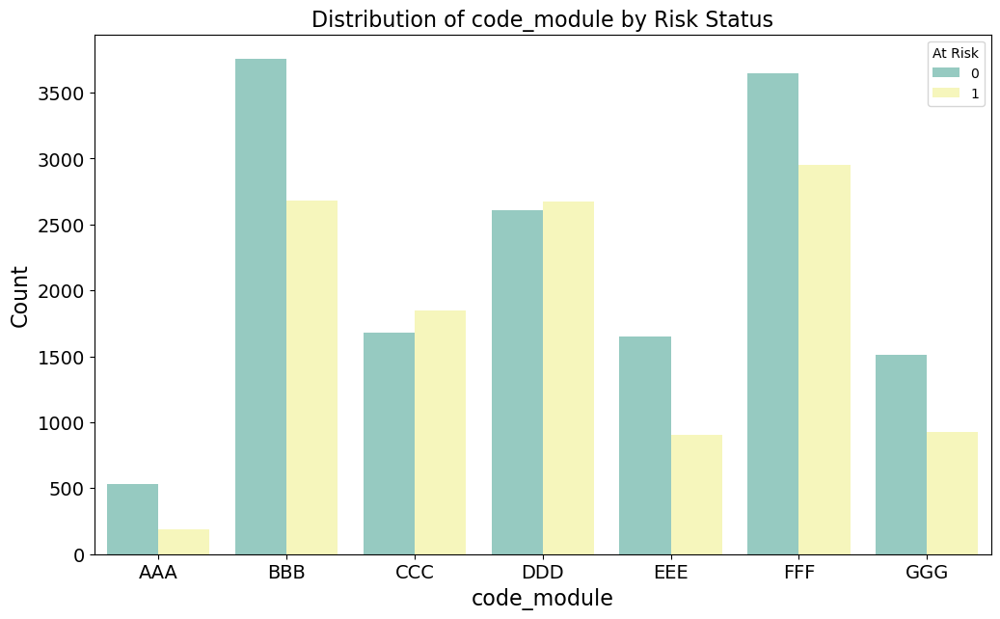

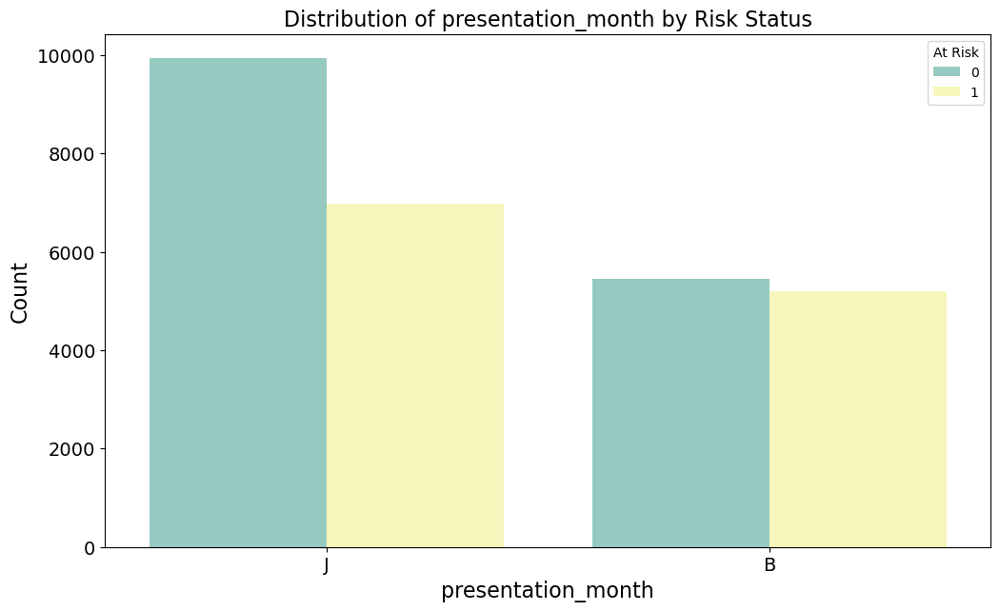

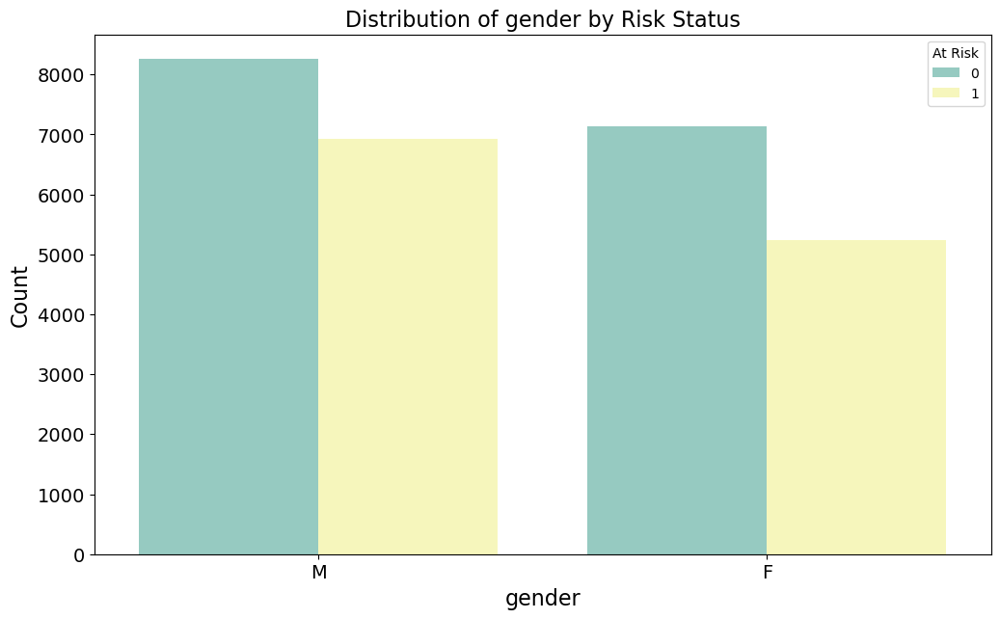

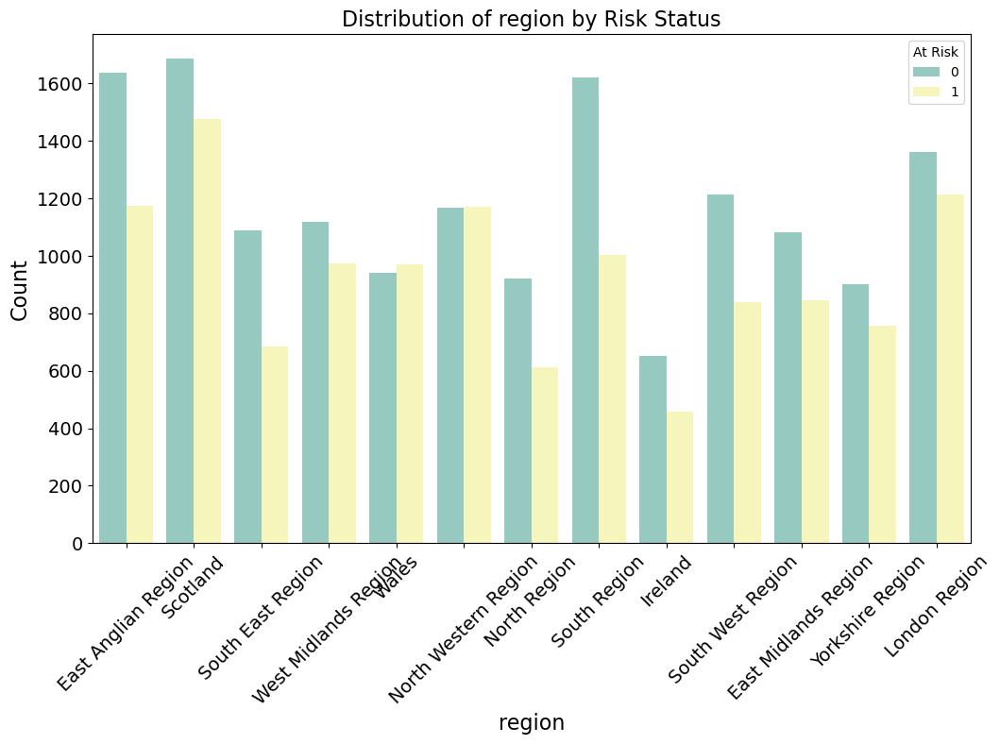

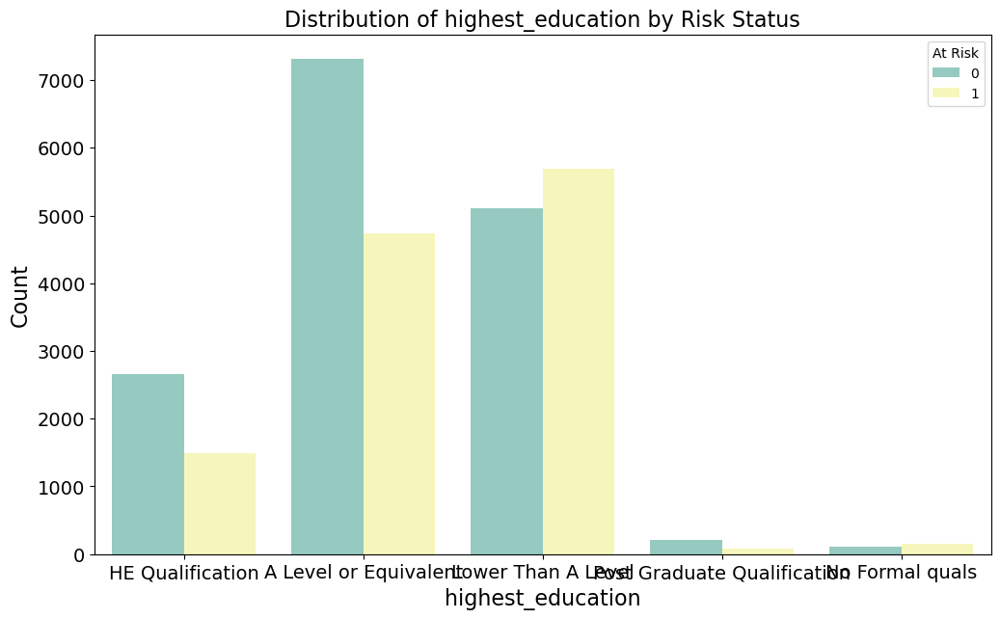

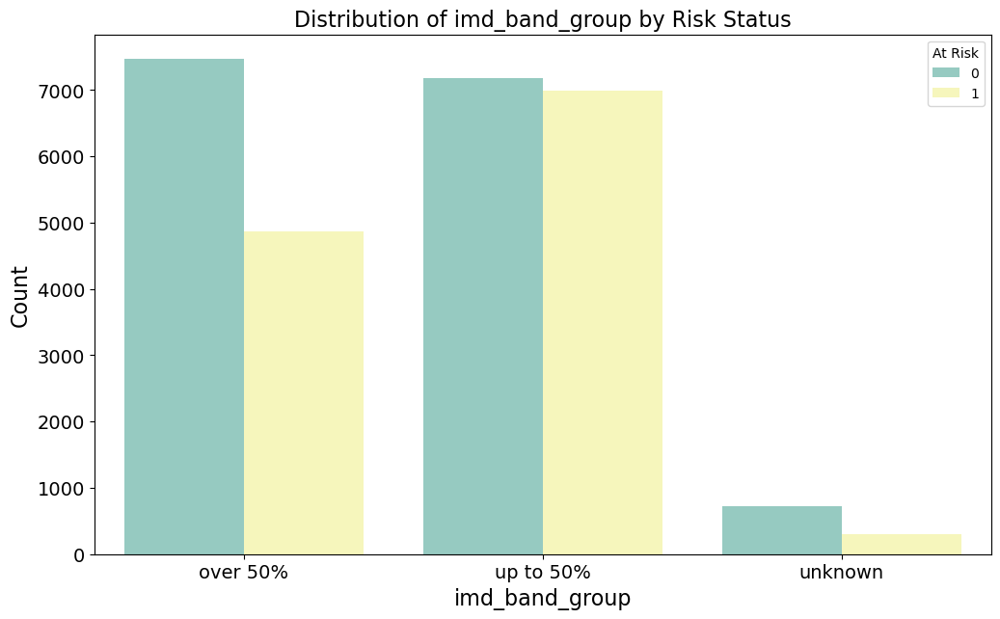

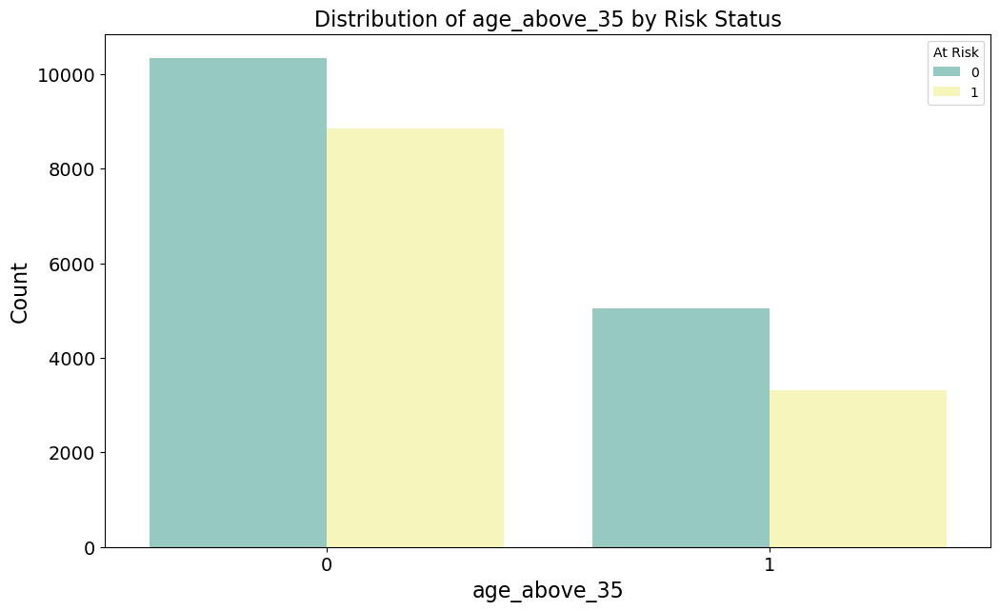

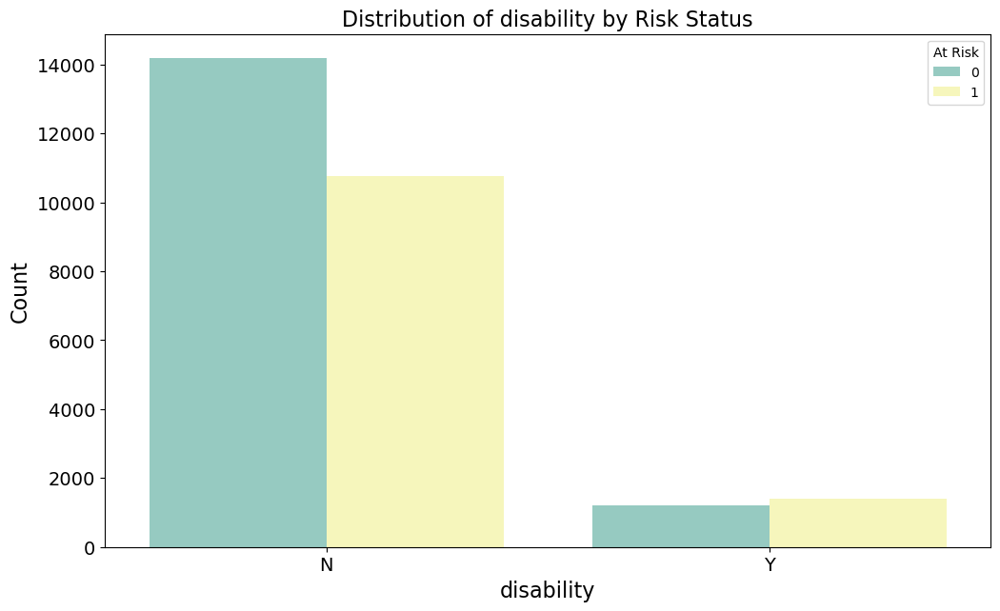

In [132]:
# Iterate through the categorical features and plot the distribution
for feature in categorical_features:
    plt.figure(figsize=(12, 7))
    sns.countplot(data=stud_info_vle_filled, x=feature, hue='at_risk', palette='Set3')
    plt.title(f'Distribution of {feature} by Risk Status', fontsize=16)
    plt.xlabel(feature, fontsize=16)
    plt.ylabel('Count', fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend(title='At Risk')
    if feature == 'region':
        plt.xticks(rotation=45)
    plt.show()

In [133]:
# Combine the small-sized highest_education categories into relevant bigger categories due to small sample sizes
## Combine 'No Formal quals' into 'Lower Than A Level', and 'Post Graduate Qualification' into 'HE Qualification'
stud_info_vle_filled['highest_education_grouped'] = stud_info_vle_filled['highest_education'].replace({
    'No Formal quals': 'Lower Than A Level',
    'Post Graduate Qualification': 'HE Qualification'
})


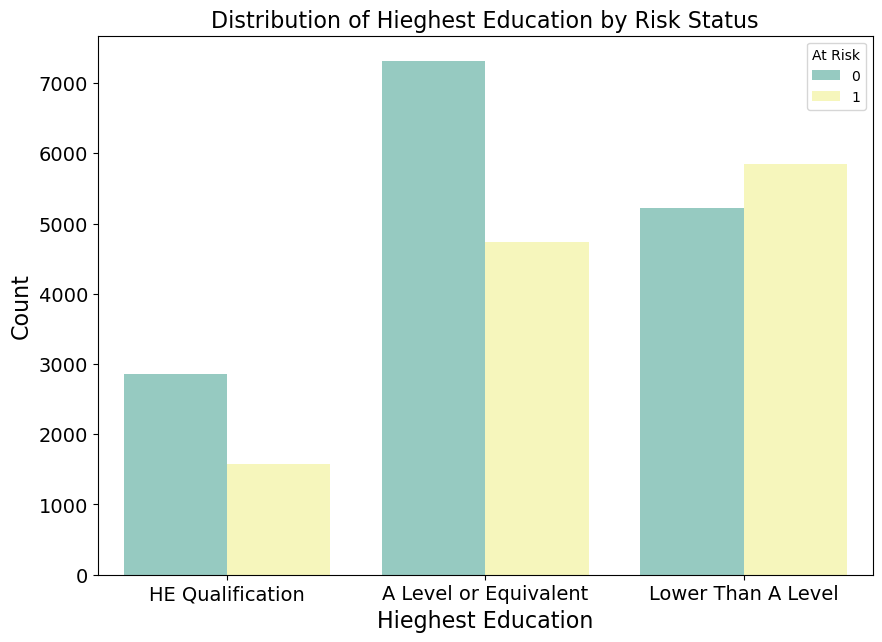

In [134]:
plt.figure(figsize=(10, 7))
sns.countplot(data=stud_info_vle_filled, x='highest_education_grouped', hue='at_risk', palette='Set3')
plt.title(f'Distribution of Hieghest Education by Risk Status', fontsize=16)
plt.xlabel('Hieghest Education', fontsize=16)
plt.ylabel('Count', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(title='At Risk')
plt.show()

## Check Distribution of target vs numerical features

In [135]:
stud_info_vle_filled.describe( )

,id_student,num_of_prev_attempts,studied_credits,at_risk,age_above_35,year,vle_access_times_all,vle_active_days_all,total_click,vle_access_times_f4w,vle_active_days_f4w,total_click_f4w,frequent_activity_variety_f4w,total_click_first_2_weeks,forumng,homepage,less_common_vle,oucollaborate,oucontent,ouwiki,page,quiz,resource,subpage,url,module_presentation_length,cma_count,tma_count,cma_total_weight,tma_total_weight,cma_tma_weight_ratio,assessment1_within_f4w,assessment1_is_tma,assessment1_weight,assessment1_score,assessment1_weighted_score,had_vle_record,vle_avg_engagement,vle_avg_engagement_f4w,weekly_avg_click,weekly_avg_access_times,weekly_avg_click_f4w,weekly_avg_access_times_f4w,avg_biweekly_click_change
count,2.755300e+04,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000
mean,7.081058e+05,0.159983,76.369361,0.441622,0.303633,2013.571081,383.350815,65.054186,1425.410082,98.621239,14.355787,350.559322,4.532791,208.901862,92.129677,69.109970,2.662396,0.884513,72.828984,6.000436,1.304976,47.229267,13.272820,37.857475,7.278808,255.946539,3.853482,4.963089,5.079846,86.071753,0.153848,0.818858,0.830545,7.156698,66.213225,5.068058,0.981418,0.254208,0.056217,38.941834,10.489940,87.639831,24.655310,-16.811100
std,5.542175e+05,0.472793,38.281507,0.496589,0.459834,0.494931,381.414828,53.988191,1755.981535,90.867855,10.147728,422.178851,2.518115,281.735204,181.713954,86.000087,10.533438,2.607284,114.625732,16.877686,3.482484,104.163026,20.112972,49.544384,12.503493,13.174618,2.893643,0.966285,9.182868,28.301943,0.290023,0.385143,0.375160,5.336031,29.293955,4.637240,0.135047,0.210900,0.039926,47.926294,10.441975,105.544713,22.716964,52.586061
min,6.516000e+03,0.000000,30.000000,0.000000,0.000000,2013.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,234.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-859.750000
25%,5.058150e+05,0.000000,60.000000,0.000000,0.000000,2013.000000,111.000000,22.000000,312.000000,33.000000,6.000000,88.000000,3.000000,38.000000,5.000000,20.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,3.000000,6.000000,0.000000,241.000000,0.000000,4.000000,0.000000,75.000000,0.000000,1.000000,1.000000,2.000000,58.000000,0.800000,1.000000,0.085821,0.025000,8.575000,3.055970,22.000000,8.250000,-30.000000
50%,5.886910e+05,0.000000,60.000000,0.000000,0.000000,2014.000000,264.000000,51.000000,809.000000,73.000000,12.000000,221.000000,5.000000,119.000000,35.000000,46.000000,0.000000,0.000000,28.000000,0.000000,0.000000,0.000000,8.000000,20.000000,3.000000,262.000000,5.000000,5.000000,0.000000,100.000000,0.000000,1.000000,1.000000,5.000000,75.000000,3.750000,1.000000,0.200743,0.048507,22.166667,7.214559,55.250000,18.250000,-6.500000
75%,6.410730e+05,0.000000,90.000000,1.000000,1.000000,2014.000000,533.000000,96.000000,1877.000000,138.000000,21.000000,462.000000,6.000000,271.000000,107.000000,88.000000,2.000000,1.000000,94.000000,1.000000,0.000000,73.000000,17.000000,51.000000,9.000000,268.000000,7.000000,6.000000,5.000000,100.000000,0.333333,1.000000,1.000000,12.500000,86.000000,9.100000,1.000000,0.371747,0.080460,51.120332,14.574627,115.500000,34.500000,5.250000
max,2.710343e+06,6.000000,630.000000,1.000000,1.000000,2014.000000,3078.000000,286.000000,24139.000000,792.000000,53.00000

In [136]:
stud_info_vle_filled['num_of_prev_attempts'].value_counts()


num_of_prev_attempts
0    24073
1     2770
2      554
3      111
4       31
5       11
6        3
Name: count, dtype: int64

The num_of_prev_attempts column shows a highly imbalanced distribution of previous attempts, with the vast majority of students having 0 previous attempts.

We will cap it to a maximum of 3 to retain some granularity while limiting the impact of outliers.

In [137]:
stud_info_vle_filled['num_of_prev_attempts_capped'] = np.clip(stud_info_vle_filled['num_of_prev_attempts'], 0, 3)
stud_info_vle_filled['num_of_prev_attempts_capped'].value_counts()


num_of_prev_attempts_capped
0    24073
1     2770
2      554
3      156
Name: count, dtype: int64

<Axes: xlabel='num_of_prev_attempts_capped', ylabel='count'>

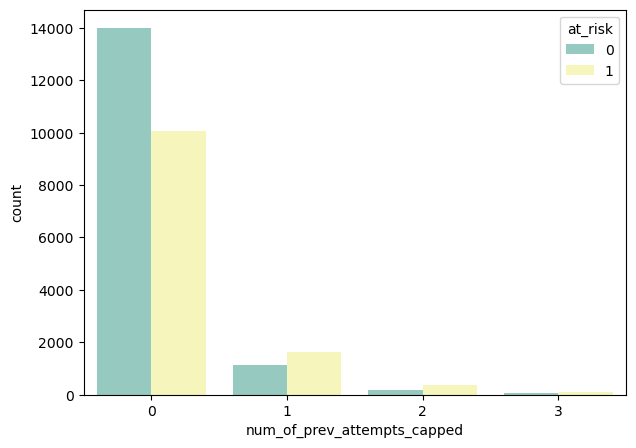

In [138]:
# Plot the distribution of the capped number of previous attempts
plt.figure(figsize=(7, 5))
sns.countplot(data=stud_info_vle_filled, x='num_of_prev_attempts_capped', hue='at_risk', palette='Set3')

In [139]:
stud_info_vle_filled.columns

Index(['code_module', 'code_presentation', 'id_student', 'gender', 'region',
       'highest_education', 'imd_band', 'age_band', 'num_of_prev_attempts',
       'studied_credits', 'disability', 'final_result', 'imd_band_new',
       'imd_band_group', 'outcome_3', 'at_risk', 'age_above_35', 'year',
       'presentation_month', 'vle_access_times_all', 'vle_active_days_all',
       'total_click', 'vle_access_times_f4w', 'vle_active_days_f4w',
       'total_click_f4w', 'frequent_activity_variety_f4w',
       'total_click_first_2_weeks', 'forumng', 'homepage', 'less_common_vle',
       'oucollaborate', 'oucontent', 'ouwiki', 'page', 'quiz', 'resource',
       'subpage', 'url', 'module_presentation_length', 'cma_count',
       'tma_count', 'cma_total_weight', 'tma_total_weight',
       'cma_tma_weight_ratio', 'assessment1_within_f4w', 'assessment1_is_tma',
       'assessment1_weight', 'assessment1_score', 'assessment1_weighted_score',
       'had_vle_record', 'vle_avg_engagement', 'vle_avg_en

In [140]:
numerical_features = [
    # Demographic features
    'num_of_prev_attempts_capped', 'studied_credits', 
    # Course / Assessment features
    'module_presentation_length', 'cma_count', 'tma_count', 
    'cma_total_weight', 'tma_total_weight', 'cma_tma_weight_ratio', #7
    'assessment1_within_f4w', 'assessment1_is_tma', 'assessment1_weight', 'assessment1_weighted_score', #11
    # VLE Interaction features
    'vle_access_times_all', 'vle_active_days_all',
    'vle_avg_engagement', 'vle_avg_engagement_f4w', 
    'vle_access_times_f4w', 'vle_active_days_f4w',
    'weekly_avg_access_times', 'frequent_activity_variety_f4w',
    'total_click', 'weekly_avg_click',  
    'weekly_avg_access_times_f4w', 'avg_biweekly_click_change',  #23
    'total_click_f4w', 'total_click_first_2_weeks', 'weekly_avg_click_f4w', #26    
       'forumng', 'homepage', 'less_common_vle',
       'oucollaborate', 'oucontent', 'ouwiki', 'page', 'quiz', 'resource',
       'subpage', 'url',                       
]
                      
interaction_columns_all = numerical_features [12:]

vle_click_columns_f4w = numerical_features [24:]

vle_activities_columns = numerical_features [27:]

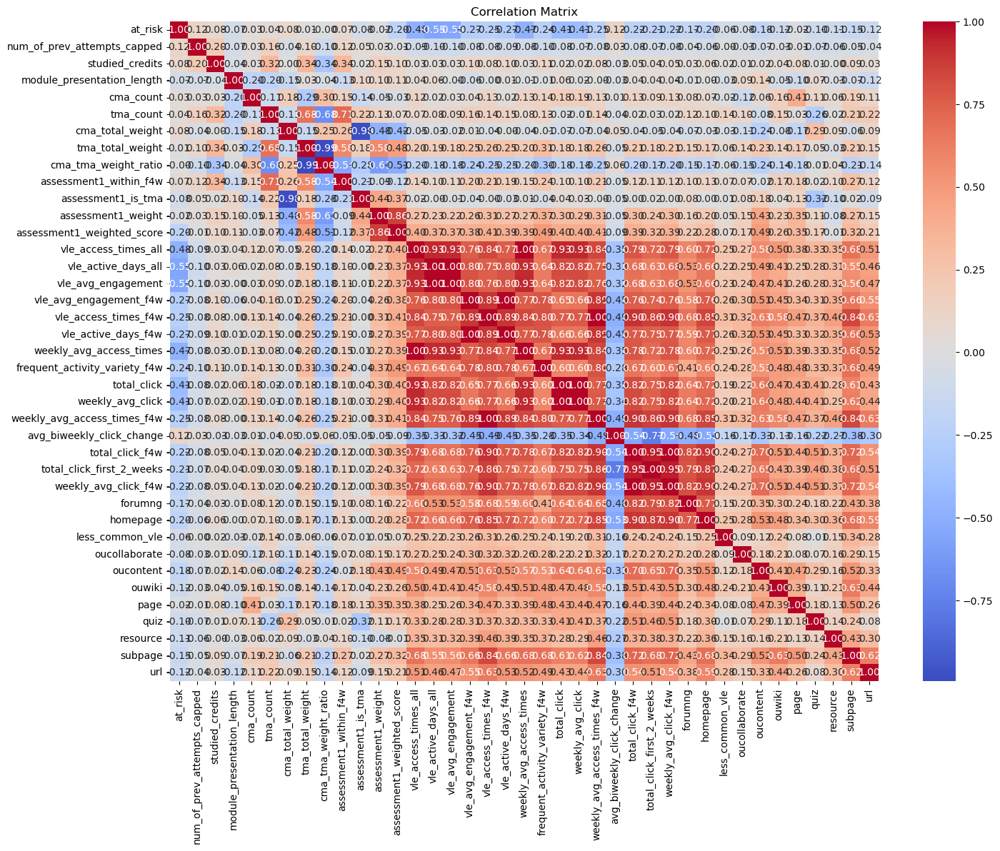

In [141]:
# Add 'at_risk' to the beginning of the numerical features list
numerical_features_with_risk = ['at_risk'] + numerical_features

# Check correlation between numerical features including 'at_risk'
plt.figure(figsize=(16, 12))
sns.heatmap(stud_info_vle_filled[numerical_features_with_risk].corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

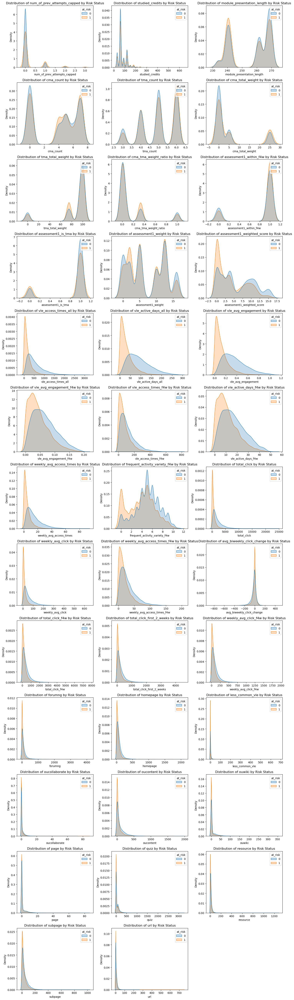

In [142]:
# Plot for each of the interaction columns in a grid of 3 plots per row
num_cols = 3
num_rows = (len(numerical_features) + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 4))

for i, col in enumerate(numerical_features):
    row = i // num_cols
    col_idx = i % num_cols
    sns.kdeplot(data=stud_info_vle_filled, x=col, hue='at_risk', fill=True, common_norm=False, ax=axes[row, col_idx])
    axes[row, col_idx].set_title(f'Distribution of {col} by Risk Status')
    axes[row, col_idx].set_xlabel(col)
    axes[row, col_idx].set_ylabel('Density')

# Remove any empty subplots
for j in range(i + 1, num_rows * num_cols):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()


#### Comments about the density plots:
It is better to go with our plan 2 - using binary 'at_risk' classes as our target ...

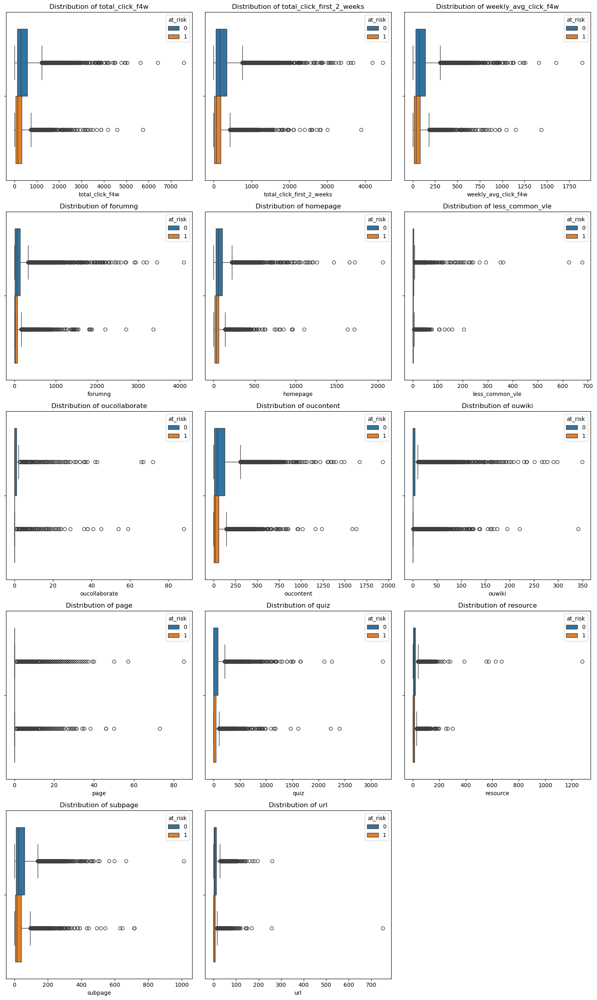

In [143]:
# Check the distribution of clicks-related columns in a grid of 3 plots per row

num_cols = 3
num_rows = (len(vle_click_columns_f4w) + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5))

for i, col in enumerate(vle_click_columns_f4w):
    row = i // num_cols
    col_idx = i % num_cols
    sns.boxplot(x=stud_info_vle_filled[col], ax=axes[row, col_idx], hue=stud_info_vle_filled['at_risk'])
    axes[row, col_idx].set_title(f'Distribution of {col}')

# Remove any empty subplots
for j in range(i + 1, num_rows * num_cols):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()

In [144]:
# Applying a log transformation to click-related columns to help reduce the skewness and compress the large outliers
for col in vle_click_columns_f4w:
    stud_info_vle_filled[f'{col}_log'] = np.log1p(stud_info_vle_filled[col])

# Save the log column names in a list
vle_click_logs = [f'{col}_log' for col in vle_click_columns_f4w]

In [145]:
# Calculate the proportion of each activity type relative to the total number of clicks for first 4 weeks
for col in vle_activities_columns:
    stud_info_vle_filled[f'{col}_prop'] = stud_info_vle_filled.apply(
        lambda row: row[col] / row['total_click_f4w'] if row['total_click_f4w'] > 0 else 0,
        axis=1
    )
# Save the proportion column names in a list
vle_activity_props = [f'{col}_prop' for col in vle_activities_columns]
vle_activity_props

['forumng_prop',
 'homepage_prop',
 'less_common_vle_prop',
 'oucollaborate_prop',
 'oucontent_prop',
 'ouwiki_prop',
 'page_prop',
 'quiz_prop',
 'resource_prop',
 'subpage_prop',
 'url_prop']

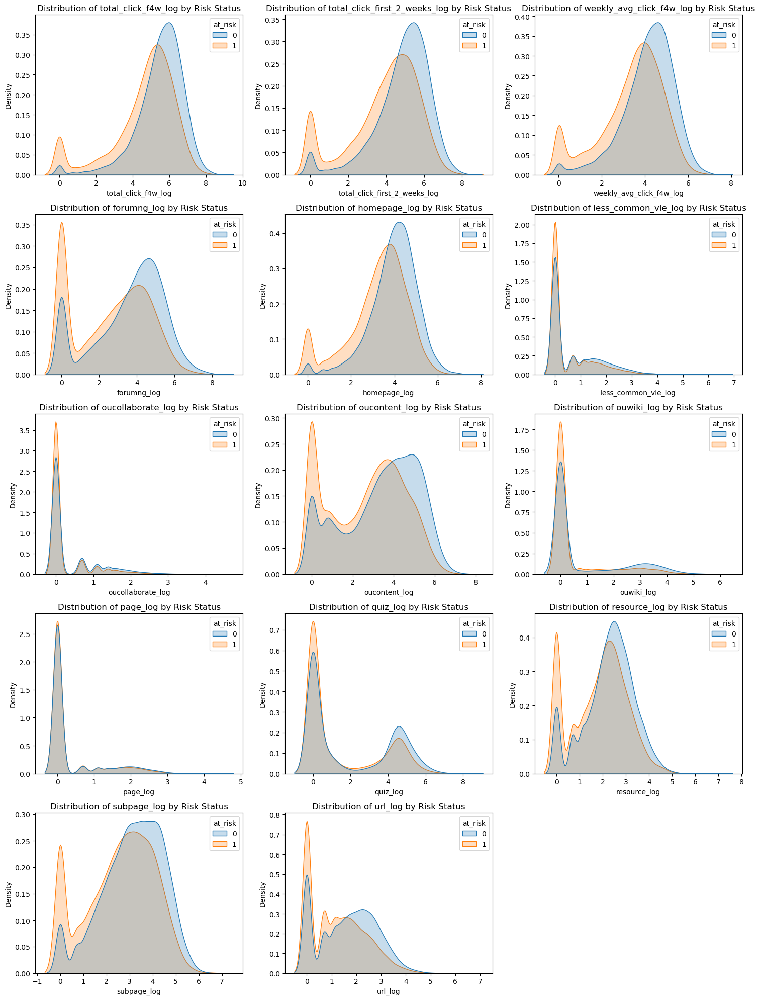

In [146]:
# Plot for each of the log columns in a grid of 3 plots per row
num_cols = 3
num_rows = (len(vle_click_logs) + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 4))

for i, col in enumerate(vle_click_logs):
    row = i // num_cols
    col_idx = i % num_cols
    sns.kdeplot(data=stud_info_vle_filled, x=col, hue='at_risk', fill=True, common_norm=False, ax=axes[row, col_idx])
    axes[row, col_idx].set_title(f'Distribution of {col} by Risk Status')
    axes[row, col_idx].set_xlabel(col)
    axes[row, col_idx].set_ylabel('Density')

# Remove any empty subplots
for j in range(i + 1, num_rows * num_cols):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()

In [147]:
stud_info_vle_filled.describe()

,id_student,num_of_prev_attempts,studied_credits,at_risk,age_above_35,year,vle_access_times_all,vle_active_days_all,total_click,vle_access_times_f4w,vle_active_days_f4w,total_click_f4w,frequent_activity_variety_f4w,total_click_first_2_weeks,forumng,homepage,less_common_vle,oucollaborate,oucontent,ouwiki,page,quiz,resource,subpage,url,module_presentation_length,cma_count,tma_count,cma_total_weight,tma_total_weight,cma_tma_weight_ratio,assessment1_within_f4w,assessment1_is_tma,assessment1_weight,assessment1_score,assessment1_weighted_score,had_vle_record,vle_avg_engagement,vle_avg_engagement_f4w,weekly_avg_click,weekly_avg_access_times,weekly_avg_click_f4w,weekly_avg_access_times_f4w,avg_biweekly_click_change,num_of_prev_attempts_capped,total_click_f4w_log,total_click_first_2_weeks_log,weekly_avg_click_f4w_log,forumng_log,homepage_log,less_common_vle_log,oucollaborate_log,oucontent_log,ouwiki_log,page_log,quiz_log,resource_log,subpage_log,url_log,forumng_prop,homepage_prop,less_common_vle_prop,oucollaborate_prop,oucontent_prop,ouwiki_prop,page_prop,quiz_prop,resource_prop,subpage_prop,url_prop
count,2.755300e+04,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000
mean,7.081058e+05,0.159983,76.369361,0.441622,0.303633,2013.571081,383.350815,65.054186,1425.410082,98.621239,14.355787,350.559322,4.532791,208.901862,92.129677,69.109970,2.662396,0.884513,72.828984,6.000436,1.304976,47.229267,13.272820,37.857475,7.278808,255.946539,3.853482,4.963089,5.079846,86.071753,0.153848,0.818858,0.830545,7.156698,66.213225,5.068058,0.981418,0.254208,0.056217,38.941834,10.489940,87.639831,24.655310,-16.811100,0.157732,5.103100,4.434716,3.803010,3.175288,3.654411,0.635215,0.325856,3.046551,0.699646,0.378111,1.769986,2.088219,2.879769,1.454597,0.206394,0.236888,0.008015,0.002586,0.187886,0.010217,0.003113,0.111796,0.061103,0.115041,0.022846
std,5.542175e+05,0.472793,38.281507,0.496589,0.459834,0.494931,381.414828,53.988191,1755.981535,90.867855,10.147728,422.178851,2.518115,281.735204,181.713954,86.000087,10.533438,2.607284,114.625732,16.877686,3.482484,104.163026,20.112972,49.544384,12.503493,13.174618,2.893643,0.966285,9.182868,28.301943,0.290023,0.385143,0.375160,5.336031,29.293955,4.637240,0.135047,0.210900,0.039926,47.926294,10.441975,105.544713,22.716964,52.586061,0.455022,1.575791,1.700813,1.381142,1.957360,1.259133,0.936613,0.634041,1.869523,1.292036,0.772223,2.180451,1.136503,1.414086,1.144909,0.196361,0.143291,0.024915,0.009956,0.175810,0.024857,0.011924,0.193707,0.084285,0.090637,0.034635
min,6.516000e+03,0.000000,30.000000,0.000000,0.000000,2013.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,234.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-859.750000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0

In [148]:
stud_info_vle_filled.columns

Index(['code_module', 'code_presentation', 'id_student', 'gender', 'region',
       'highest_education', 'imd_band', 'age_band', 'num_of_prev_attempts',
       'studied_credits', 'disability', 'final_result', 'imd_band_new',
       'imd_band_group', 'outcome_3', 'at_risk', 'age_above_35', 'year',
       'presentation_month', 'vle_access_times_all', 'vle_active_days_all',
       'total_click', 'vle_access_times_f4w', 'vle_active_days_f4w',
       'total_click_f4w', 'frequent_activity_variety_f4w',
       'total_click_first_2_weeks', 'forumng', 'homepage', 'less_common_vle',
       'oucollaborate', 'oucontent', 'ouwiki', 'page', 'quiz', 'resource',
       'subpage', 'url', 'module_presentation_length', 'cma_count',
       'tma_count', 'cma_total_weight', 'tma_total_weight',
       'cma_tma_weight_ratio', 'assessment1_within_f4w', 'assessment1_is_tma',
       'assessment1_weight', 'assessment1_score', 'assessment1_weighted_score',
       'had_vle_record', 'vle_avg_engagement', 'vle_avg_en

In [149]:
stud_info_vle_filled.shape

(27553, 84)

In [150]:
df01 = stud_info_vle_filled.copy()

In [151]:
binary_features = ['gender', 'disability', 'presentation_month']

# Define the mappings for binary features
binary_mappings = {
    'gender': {'F': 0, 'M': 1},
    'disability': {'N': 0, 'Y': 1},
    'presentation_month': {'B': 0, 'J': 1}
}

# Apply the mappings to the dataframe
for feature, mapping in binary_mappings.items():
    df01[feature] = df01[feature].map(mapping)

# Verify the changes
df01[binary_mappings.keys()].head(10)


,gender,disability,presentation_month
0,1,0,1
1,0,0,1
2,0,0,1
3,0,0,1
4,1,0,1
5,1,0,1
6,0,0,1
7,0,0,1
8,1,0,1
9,1,0,1


In [152]:
# One-hot encoding without drop_first to keep all categories - useful for clustering
categorical_features = ['code_module','region', 'highest_education_grouped', 'age_band', 'imd_band_group']

df02 = pd.get_dummies(df01, columns=categorical_features, drop_first=False)

In [153]:
# df02['final_result'].value_counts()

In [154]:
df02.shape

(27553, 108)

In [155]:
print(df02.columns)


Index(['code_presentation', 'id_student', 'gender', 'highest_education',
       'imd_band', 'num_of_prev_attempts', 'studied_credits', 'disability',
       'final_result', 'imd_band_new',
       ...
       'region_Yorkshire Region',
       'highest_education_grouped_A Level or Equivalent',
       'highest_education_grouped_HE Qualification',
       'highest_education_grouped_Lower Than A Level', 'age_band_0-35',
       'age_band_35-55', 'age_band_55<=', 'imd_band_group_over 50%',
       'imd_band_group_unknown', 'imd_band_group_up to 50%'],
      dtype='object', length=108)


In [156]:
df02.describe()

,id_student,gender,num_of_prev_attempts,studied_credits,disability,at_risk,age_above_35,year,presentation_month,vle_access_times_all,vle_active_days_all,total_click,vle_access_times_f4w,vle_active_days_f4w,total_click_f4w,frequent_activity_variety_f4w,total_click_first_2_weeks,forumng,homepage,less_common_vle,oucollaborate,oucontent,ouwiki,page,quiz,resource,subpage,url,module_presentation_length,cma_count,tma_count,cma_total_weight,tma_total_weight,cma_tma_weight_ratio,assessment1_within_f4w,assessment1_is_tma,assessment1_weight,assessment1_score,assessment1_weighted_score,had_vle_record,vle_avg_engagement,vle_avg_engagement_f4w,weekly_avg_click,weekly_avg_access_times,weekly_avg_click_f4w,weekly_avg_access_times_f4w,avg_biweekly_click_change,num_of_prev_attempts_capped,total_click_f4w_log,total_click_first_2_weeks_log,weekly_avg_click_f4w_log,forumng_log,homepage_log,less_common_vle_log,oucollaborate_log,oucontent_log,ouwiki_log,page_log,quiz_log,resource_log,subpage_log,url_log,forumng_prop,homepage_prop,less_common_vle_prop,oucollaborate_prop,oucontent_prop,ouwiki_prop,page_prop,quiz_prop,resource_prop,subpage_prop,url_prop
count,2.755300e+04,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000,27553.000000
mean,7.081058e+05,0.550938,0.159983,76.369361,0.094944,0.441622,0.303633,2013.571081,0.613581,383.350815,65.054186,1425.410082,98.621239,14.355787,350.559322,4.532791,208.901862,92.129677,69.109970,2.662396,0.884513,72.828984,6.000436,1.304976,47.229267,13.272820,37.857475,7.278808,255.946539,3.853482,4.963089,5.079846,86.071753,0.153848,0.818858,0.830545,7.156698,66.213225,5.068058,0.981418,0.254208,0.056217,38.941834,10.489940,87.639831,24.655310,-16.811100,0.157732,5.103100,4.434716,3.803010,3.175288,3.654411,0.635215,0.325856,3.046551,0.699646,0.378111,1.769986,2.088219,2.879769,1.454597,0.206394,0.236888,0.008015,0.002586,0.187886,0.010217,0.003113,0.111796,0.061103,0.115041,0.022846
std,5.542175e+05,0.497408,0.472793,38.281507,0.293143,0.496589,0.459834,0.494931,0.486937,381.414828,53.988191,1755.981535,90.867855,10.147728,422.178851,2.518115,281.735204,181.713954,86.000087,10.533438,2.607284,114.625732,16.877686,3.482484,104.163026,20.112972,49.544384,12.503493,13.174618,2.893643,0.966285,9.182868,28.301943,0.290023,0.385143,0.375160,5.336031,29.293955,4.637240,0.135047,0.210900,0.039926,47.926294,10.441975,105.544713,22.716964,52.586061,0.455022,1.575791,1.700813,1.381142,1.957360,1.259133,0.936613,0.634041,1.869523,1.292036,0.772223,2.180451,1.136503,1.414086,1.144909,0.196361,0.143291,0.024915,0.009956,0.175810,0.024857,0.011924,0.193707,0.084285,0.090637,0.034635
min,6.516000e+03,0.000000,0.000000,30.000000,0.000000,0.000000,0.000000,2013.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,234.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-859.750000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000

### Clustering students based on their demographics and vle interaction patterns

In [157]:
student_features = df02.drop(columns=[
    # Remove Course or assessment-related columns and target
    'code_presentation', 'code_module_AAA', 'code_module_BBB', 'code_module_CCC', 'code_module_DDD', 'code_module_EEE', 'code_module_FFF', 'code_module_GGG',
    'year', 'presentation_month',
    'final_result', 'outcome_3', 'at_risk', 
    'tma_count', 'cma_count', 'module_presentation_length', 
    'tma_total_weight', 'cma_total_weight', 'cma_tma_weight_ratio',
    'assessment1_within_f4w', 'assessment1_is_tma', 'assessment1_weight', 'assessment1_score',

    # Remove the log columns 
#    'weekly_avg_click_log', #'total_click_f4w_log', 'total_click_first_2_weeks_log', 
   'forumng_log', 'homepage_log', 'less_common_vle_log', 'oucollaborate_log',
       'oucontent_log', 'ouwiki_log', 'page_log', 'quiz_log', 'resource_log',
       'subpage_log', 'url_log', 'weekly_avg_click_f4w_log',
    #    'avg_biweekly_click_change_log', 

    # Remove the original click columns (first 4 weeks and overall total) 
    'vle_access_times_all', 'vle_active_days_all', 'total_click', 
    'total_click_first_2_weeks', 'vle_avg_engagement', 'weekly_avg_click', 'weekly_avg_access_times',
    'total_click_f4w', 
    # 'vle_access_times_f4w', 'vle_active_days_f4w', 
    'vle_avg_engagement_f4w', 'weekly_avg_click_f4w', 'weekly_avg_access_times_f4w',

    'forumng', 'homepage', 'less_common_vle', 'oucollaborate',
    'oucontent', 'ouwiki', 'page', 'quiz',
    'resource', 'subpage', 'url',

    # Remove other redundant columns (e.g. already encoded)
    'id_student', 'highest_education', 'imd_band', 'imd_band_new', 'age_band_0-35', 'age_band_35-55', 'age_band_55<=', 'num_of_prev_attempts'
])

student_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27553 entries, 0 to 27552
Data columns (total 43 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   gender                                           27553 non-null  int64  
 1   studied_credits                                  27553 non-null  int64  
 2   disability                                       27553 non-null  int64  
 3   age_above_35                                     27553 non-null  int32  
 4   vle_access_times_f4w                             27553 non-null  float64
 5   vle_active_days_f4w                              27553 non-null  float64
 6   frequent_activity_variety_f4w                    27553 non-null  float64
 7   assessment1_weighted_score                       27553 non-null  float64
 8   had_vle_record                                   27553 non-null  int64  
 9   avg_biweekly_click_change   

In [158]:
# Scale the features
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_scaled = scaler.fit_transform(student_features)

# Set the randome seed
seed = 42


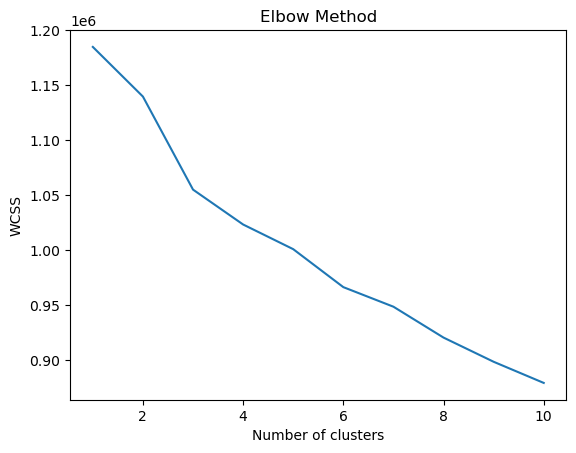

In [159]:
# Checking Elbow Method
from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):  # Try 1 to 10 clusters
    kmeans = KMeans(n_clusters=i, random_state=seed)
    kmeans.fit(df_scaled)
    wcss.append(kmeans.inertia_)  # Inertia is the WCSS (within-cluster sum of squares)

# Plot Elbow Method
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()


In [160]:
# Perform clustering 

kmeans = KMeans(n_clusters=3, random_state=seed)  # 
clusters = kmeans.fit_predict(df_scaled)


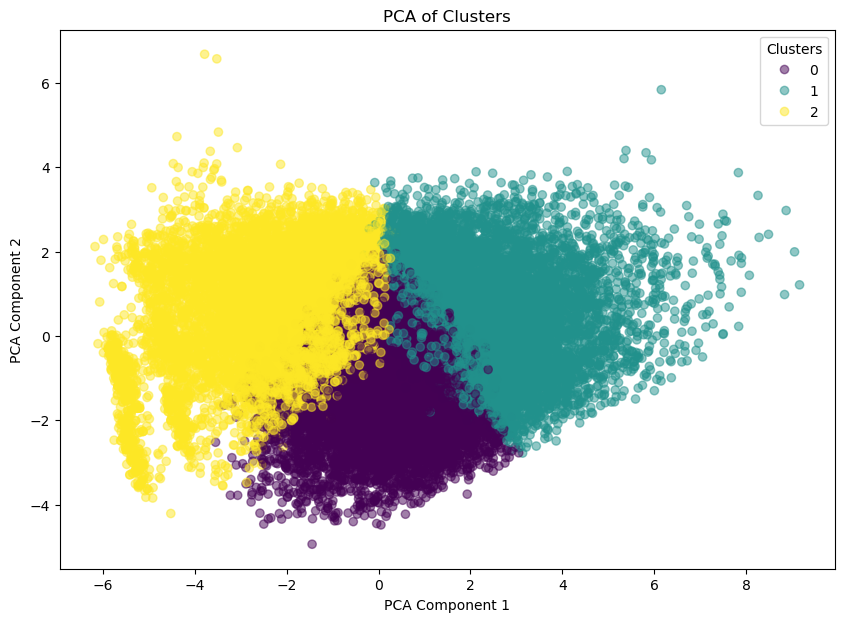

In [161]:
# Visualise the clusters in 2D using PCA
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_scaled)

# Add the PCA results and cluster labels to a dataframe for easy plotting
df_viz = pd.DataFrame(pca_result, columns=['PCA1', 'PCA2'])
df_viz['cluster'] = clusters  

# Plot the clusters 
plt.figure(figsize=(10, 7))
scatter = plt.scatter(df_viz['PCA1'], df_viz['PCA2'], c=df_viz['cluster'], cmap='viridis', alpha=0.5)
plt.title('PCA of Clusters')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.show()


In [162]:
# Apply one-hot encoding with drop_first=True for all categorical features - to avoid multicollinearity and get the data ready for linear models
categorical_features = ['code_module','region', 'highest_education_grouped', 'age_band', 'imd_band_group']
df03 = pd.get_dummies(df01, columns=categorical_features, drop_first=False)

# Drop unnecessary columns

df03 = df03.drop(columns=[    
    'id_student', 'highest_education', 'imd_band', 'imd_band_new', 'age_band_0-35', 'age_band_35-55', 'age_band_55<='
])

In [163]:
student_features['cluster'] = clusters
df03['cluster'] = clusters

In [164]:
df03['cluster'].value_counts()

cluster
2    9905
0    8866
1    8782
Name: count, dtype: int64

### Rationale of the choice of clusters:
* Not too few that would have a large group of mixed features, 
* Not too many to overwhelm or making redundant information about the students
* More balanced number of students in each cluster

In [165]:
student_features.columns

Index(['gender', 'studied_credits', 'disability', 'age_above_35',
       'vle_access_times_f4w', 'vle_active_days_f4w',
       'frequent_activity_variety_f4w', 'assessment1_weighted_score',
       'had_vle_record', 'avg_biweekly_click_change',
       'num_of_prev_attempts_capped', 'total_click_f4w_log',
       'total_click_first_2_weeks_log', 'forumng_prop', 'homepage_prop',
       'less_common_vle_prop', 'oucollaborate_prop', 'oucontent_prop',
       'ouwiki_prop', 'page_prop', 'quiz_prop', 'resource_prop',
       'subpage_prop', 'url_prop', 'region_East Anglian Region',
       'region_East Midlands Region', 'region_Ireland', 'region_London Region',
       'region_North Region', 'region_North Western Region', 'region_Scotland',
       'region_South East Region', 'region_South Region',
       'region_South West Region', 'region_Wales',
       'region_West Midlands Region', 'region_Yorkshire Region',
       'highest_education_grouped_A Level or Equivalent',
       'highest_education_gro

In [166]:
student_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27553 entries, 0 to 27552
Data columns (total 44 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   gender                                           27553 non-null  int64  
 1   studied_credits                                  27553 non-null  int64  
 2   disability                                       27553 non-null  int64  
 3   age_above_35                                     27553 non-null  int32  
 4   vle_access_times_f4w                             27553 non-null  float64
 5   vle_active_days_f4w                              27553 non-null  float64
 6   frequent_activity_variety_f4w                    27553 non-null  float64
 7   assessment1_weighted_score                       27553 non-null  float64
 8   had_vle_record                                   27553 non-null  int64  
 9   avg_biweekly_click_change   

In [167]:
# Get features that are categorical / binary from the student_features:
student_features_cat = student_features.select_dtypes(include=['int64', 'int32', 'bool']).columns
# Exclude the cluster & studied_credits columns
student_features_cat = student_features_cat.drop(['cluster', 'studied_credits'])
student_features_cat 

Index(['gender', 'disability', 'age_above_35', 'had_vle_record',
       'num_of_prev_attempts_capped', 'region_East Anglian Region',
       'region_East Midlands Region', 'region_Ireland', 'region_London Region',
       'region_North Region', 'region_North Western Region', 'region_Scotland',
       'region_South East Region', 'region_South Region',
       'region_South West Region', 'region_Wales',
       'region_West Midlands Region', 'region_Yorkshire Region',
       'highest_education_grouped_A Level or Equivalent',
       'highest_education_grouped_HE Qualification',
       'highest_education_grouped_Lower Than A Level',
       'imd_band_group_over 50%', 'imd_band_group_unknown',
       'imd_band_group_up to 50%'],
      dtype='object')

at_risk     0     1
cluster            
0        4866  4000
1        6114  2668
2        4405  5500


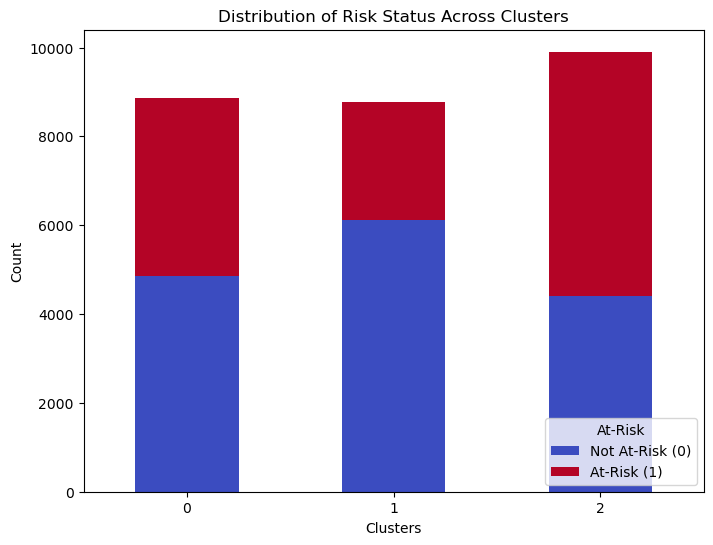

In [168]:
target_distribution = df03.groupby('cluster')['at_risk'].value_counts().unstack()
print(target_distribution)

# Plot the target distribution
ax = target_distribution.plot(kind='bar', stacked=True, figsize=(8, 6), colormap="coolwarm")
plt.title('Distribution of Risk Status Across Clusters')
plt.xlabel('Clusters')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.legend(title='At-Risk', labels=['Not At-Risk (0)', 'At-Risk (1)'], loc='lower right')

plt.show()

In [169]:
cluster_profile = student_features.groupby('cluster').mean()

cluster_profile.T

cluster,0,1,2
gender,0.796188,0.616602,0.273195
studied_credits,76.833972,81.585060,71.329127
disability,0.066095,0.094284,0.121353
age_above_35,0.239454,0.372580,0.299950
vle_access_times_f4w,75.551207,197.006718,32.040485
vle_active_days_f4w,12.413715,25.291164,6.398587
frequent_activity_variety_f4w,4.681818,6.916989,2.285512
assessment1_weighted_score,6.333429,7.359139,1.904096
had_vle_record,1.000000,1.000000,0.948309
avg_biweekly_click_change,0.158809,-47.180824,-5.074432


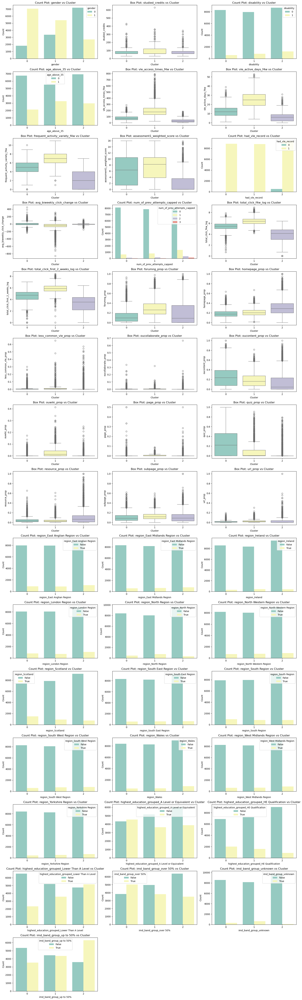

In [170]:
# Identify the numerical columns in student_features
numeric_columns = student_features.columns.drop('cluster')

# Set up the figure and the number of subplots per row 
num_cols = 3
num_plots = len(numeric_columns)
num_rows = (num_plots // num_cols) + int(num_plots % num_cols > 0)

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, num_rows * 4))
axes = axes.flatten()  # Flatten the axes array to easily iterate over

# Loop through each numerical column and plot the appropriate plot for each
for i, col in enumerate(numeric_columns):
    if col in student_features_cat:
        sns.countplot(data=student_features, x='cluster', hue=col, palette="Set3", ax=axes[i])
        axes[i].set_title(f'Count Plot: {col} vs Cluster')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Count')
    else:
        sns.boxplot(data=student_features, x='cluster', y=col, palette="Set3", ax=axes[i])
        axes[i].set_title(f'Box Plot: {col} vs Cluster')
        axes[i].set_xlabel('Cluster')
        axes[i].set_ylabel(col)

# Remove any unused subplots
for i in range(num_plots, len(axes)):
    fig.delaxes(axes[i])

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()


In [171]:
df03.columns

Index(['code_presentation', 'gender', 'num_of_prev_attempts',
       'studied_credits', 'disability', 'final_result', 'outcome_3', 'at_risk',
       'age_above_35', 'year',
       ...
       'region_Wales', 'region_West Midlands Region',
       'region_Yorkshire Region',
       'highest_education_grouped_A Level or Equivalent',
       'highest_education_grouped_HE Qualification',
       'highest_education_grouped_Lower Than A Level',
       'imd_band_group_over 50%', 'imd_band_group_unknown',
       'imd_band_group_up to 50%', 'cluster'],
      dtype='object', length=102)

In [172]:
# Implement One-Hot Encoding for the cluster column as the clusters are not ordinal (i.e., not ordered)
df04 = df03.copy()
# Convert the cluster labels to categorical
df04['cluster'] = df04['cluster'].astype('category')

# Perform one-hot encoding for the 'cluster' column
df04 = pd.get_dummies(df04, columns=['cluster'], drop_first=True)

# View the transformed dataframe
df04.head()


,code_presentation,gender,num_of_prev_attempts,studied_credits,disability,final_result,outcome_3,at_risk,age_above_35,year,presentation_month,vle_access_times_all,vle_active_days_all,total_click,vle_access_times_f4w,vle_active_days_f4w,total_click_f4w,frequent_activity_variety_f4w,total_click_first_2_weeks,forumng,homepage,less_common_vle,oucollaborate,oucontent,ouwiki,page,quiz,resource,subpage,url,module_presentation_length,cma_count,tma_count,cma_total_weight,tma_total_weight,cma_tma_weight_ratio,assessment1_within_f4w,assessment1_is_tma,assessment1_weight,assessment1_score,assessment1_weighted_score,had_vle_record,vle_avg_engagement,vle_avg_engagement_f4w,weekly_avg_click,weekly_avg_access_times,weekly_avg_click_f4w,weekly_avg_access_times_f4w,avg_biweekly_click_change,num_of_prev_attempts_capped,total_click_f4w_log,total_click_first_2_weeks_log,weekly_avg_click_f4w_log,forumng_log,homepage_log,less_common_vle_log,oucollaborate_log,oucontent_log,ouwiki_log,page_log,quiz_log,resource_log,subpage_log,url_log,forumng_prop,homepage_prop,less_common_vle_prop,oucollaborate_prop,oucontent_prop,ouwiki_prop,page_prop,quiz_prop,resource_prop,subpage_prop,url_prop,code_module_AAA,code_module_BBB,code_module_CCC,code_module_DDD,code_module_EEE,code_module_FFF,code_module_GGG,region_East Anglian Region,region_East Midlands Region,region_Ireland,region_London Region,region_North Region,region_North Western Region,region_Scotland,region_South East Region,region_South Region,region_South West Region,region_Wales,region_West Midlands Region,region_Yorkshire Region,highest_education_grouped_A Level or Equivalent,highest_education_grouped_HE Qualification,highest_education_grouped_Lower Than A Level,imd_band_group_over 50%,imd_band_group_unknown,imd_band_group_up to 50%,cluster_1,cluster_2
0,2013J,1,0,240,0,Pass,Success,0,1,2013,1,196.0,40.0,934.0,60.0,8.0,401.0,4.0,301.0,55.0,42.0,0.0,0.0,273.0,0.0,0.0,0.0,9.0,21.0,1.0,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,78.0,7.8,1,0.149254,0.029851,24.395522,5.119403,100.25,15.00,-50.25,0,5.996452,5.710427,4.617593,4.025352,3.761200,0.000000,0.0,5.613128,0.0,0.0,0.0,2.302585,3.091042,0.693147,0.137157,0.104738,0.000000,0.0,0.680798,0.0,0.0,0.0,0.022444,0.052369,0.002494,True,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False
1,2013J,0,0,60,0,Pass,Success,0,1,2013,1,430.0,80.0,1435.0,149.0,18.0,550.0,6.0,456.0,204.0,121.0,0.0,0.0,138.0,0.0,0.0,0.0,5.0,55.0,27.0,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,70.0,7.0,1,0.298507,0.067164,37.481343,11.231343,137.50,37.25,-90.50,0,6.311735,6.124683,4.930870,5.323010,4.804021,0.000000,0.0,4.934474,0.0,0.0,0.0,1.791759,4.025352,3.332205,0.370909,0.220000,0.000000,0.0,0.250909,0.0,0.0,0.0,0.009091,0.100000,0.049091,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,True,True,False
2,2013J,0,0,60,0,Pass,Success,0,1,2013,1,663.0,123.0,2158.0,136.0,21.0,478.0,6.0,345.0,131.0,94.0,1.0,0.0,175.0,0.0,0.0,0.0,10.0,50.0,17.0,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,72.0,7.2,1,0.458955,0.078358,56.365672,17.317164,119.50,34.00,-53.00,0,6.171701,5.846439,4.791650,4.882802,4.553877,0.693147,0.0,5.170484,0.0,0.0,0.0,2.397895,3.931826,2.890372,0.274059,0.196653,0.002092,0.0,0.366109,0.0,0.0,0.0,0.020921,0.104603,0.035565,True,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,True,False,False,True,False
3,2013J,0,0,60,0,Pass,Success,0,0,2013,1,352.0,70.0,1034.0,151.0,24.0,567.0,6.0,472.0,138.0,102.0,2.0,0.0,284.0,0.0,0.0,0.0,7.0,28.0,6.0,268,0.0,5.0,0.0,100.0,0.0,1,1,10.0,69.0,6.9,1,0.261194,0.089552,27.007463,9.194030,141.75,37.75,-94.25,0,6.342121,6.159095,4.961095,4.934474,4.634729,1.098612,0.0,5.652489,0.0,0.0,0.0,2.079442,3.367296,1.945910,0.243386,0.179894,0.003527,0.0,0.500882,0.0,0.0,0.0,0.012346,0.049383,0.01

In [173]:
df04.columns

Index(['code_presentation', 'gender', 'num_of_prev_attempts',
       'studied_credits', 'disability', 'final_result', 'outcome_3', 'at_risk',
       'age_above_35', 'year',
       ...
       'region_West Midlands Region', 'region_Yorkshire Region',
       'highest_education_grouped_A Level or Equivalent',
       'highest_education_grouped_HE Qualification',
       'highest_education_grouped_Lower Than A Level',
       'imd_band_group_over 50%', 'imd_band_group_unknown',
       'imd_band_group_up to 50%', 'cluster_1', 'cluster_2'],
      dtype='object', length=103)

In [174]:
df04['at_risk'].value_counts()

at_risk
0    15385
1    12168
Name: count, dtype: int64

### Notes about the following categorical features:
* code_module,
* presentation_month, 
* region 

They are excluded from our model training because the model can focus on core student behaviours, making it broadly applicable across courses, terms, and regions. This is useful especially if we need to predict outcomes for categorical variables not included in the training set.

In [175]:
combined_col = [
   'at_risk',
   'gender', 
  #  'num_of_prev_attempts',
  'num_of_prev_attempts_capped',
       'studied_credits', 'disability', 
      #  'presentation_month', 
      #  'vle_access_times_all', 'vle_active_days_all', 'total_click', 
      
      #  'vle_access_times_f4w',
      #  'vle_active_days_f4w', 
      #  'total_click_f4w',
       'frequent_activity_variety_f4w', 
      #  'total_click_first_2_weeks', 
      #  'forumng', 'homepage', 'less_common_vle', 'oucollaborate', 'oucontent', 'ouwiki',
      #  'page', 'quiz', 'resource', 'subpage', 'url',
    #    'module_presentation_length', 
      #  'cma_count', #'tma_count',
      #  'cma_total_weight', 'tma_total_weight', 
       'cma_tma_weight_ratio',
      #  'had_vle_record', 
      #  'vle_avg_engagement', 
       'vle_avg_engagement_f4w',
      #  'weekly_avg_click', #'weekly_avg_access_times', 

      #  'weekly_avg_click_log',
      'weekly_avg_click_f4w', # 
      # 'weekly_avg_click_f4w_log',
      'weekly_avg_access_times_f4w',

      #  'total_click_f4w_log',# 'total_click_first_2_weeks_log',
       'avg_biweekly_click_change',
       
   #     'forumng_log', 'homepage_log',
   #     'less_common_vle_log', 'oucollaborate_log', 'oucontent_log',
   #     'ouwiki_log', 
   #  #    'page_log', 
   #     'quiz_log', 'resource_log', 'subpage_log', 'url_log', 

       'forumng_prop', 'homepage_prop',
       'less_common_vle_prop', 'oucollaborate_prop', 'oucontent_prop', 'ouwiki_prop', 
      #  'page_prop', 
       'quiz_prop', 'resource_prop',
       'subpage_prop', 'url_prop', 

      #  'assessment1_within_f4w', 
      #  'assessment1_is_tma', 
      'assessment1_weight', #'assessment1_score', 
      'assessment1_weighted_score',

      
      #  'highest_education_grouped_A Level or Equivalent',
       'highest_education_grouped_HE Qualification',
       'highest_education_grouped_Lower Than A Level',
       'imd_band_group_over 50%', 
      #  'imd_band_group_unknown',
       'imd_band_group_up to 50%', 
       'cluster_1', 'cluster_2'       
]
model_df = df04[combined_col]
model_df.head()

,at_risk,gender,num_of_prev_attempts_capped,studied_credits,disability,frequent_activity_variety_f4w,cma_tma_weight_ratio,vle_avg_engagement_f4w,weekly_avg_click_f4w,weekly_avg_access_times_f4w,avg_biweekly_click_change,forumng_prop,homepage_prop,less_common_vle_prop,oucollaborate_prop,oucontent_prop,ouwiki_prop,quiz_prop,resource_prop,subpage_prop,url_prop,assessment1_weight,assessment1_weighted_score,highest_education_grouped_HE Qualification,highest_education_grouped_Lower Than A Level,imd_band_group_over 50%,imd_band_group_up to 50%,cluster_1,cluster_2
0,0,1,0,240,0,4.0,0.0,0.029851,100.25,15.00,-50.25,0.137157,0.104738,0.000000,0.0,0.680798,0.0,0.0,0.022444,0.052369,0.002494,10.0,7.8,True,False,True,False,False,False
1,0,0,0,60,0,6.0,0.0,0.067164,137.50,37.25,-90.50,0.370909,0.220000,0.000000,0.0,0.250909,0.0,0.0,0.009091,0.100000,0.049091,10.0,7.0,True,False,False,True,True,False
2,0,0,0,60,0,6.0,0.0,0.078358,119.50,34.00,-53.00,0.274059,0.196653,0.002092,0.0,0.366109,0.0,0.0,0.020921,0.104603,0.035565,10.0,7.2,False,False,True,False,True,False
3,0,0,0,60,0,6.0,0.0,0.089552,141.75,37.75,-94.25,0.243386,0.179894,0.003527,0.0,0.500882,0.0,0.0,0.012346,0.049383,0.010582,10.0,6.9,False,True,True,False,True,False
4,0,1,0,60,0,5.0,0.0,0.119403,181.75,46.50,-94.75,0.469051,0.239340,0.000000,0.0,0.225585,0.0,0.0,0.008253,0.042641,0.015131,10.0,7.9,False,False,True,False,True,False


In [176]:
# Save the model_df to a csv file
# model_df.to_csv('oulad_01.csv', index=False)